In [2]:
# Imagen("abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/37a0382d-f783-4728-a697-48b1dc002937/Files/BANNER BIDATING.jpeg", (20,10))

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 4, Finished, Available)

# Importaciones

In [3]:
!pip install missingno -q

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 5, Finished, Available)

In [4]:
# Modulos a utilizar
import os
import pandas as pd
import numpy as np
import pyarrow as pa
import pyarrow.parquet as pq
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
#import funciones
import warnings
warnings.filterwarnings(action= 'ignore')


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 6, Finished, Available)

# Funciones

In [5]:
def Imagen(path_relativo: str, size: tuple[int,int], path_absoluto:  None|str= None):

    """
    Esta funcion recibe un path relativo referente a una imagen (o un path absoluto), y el tamaño/dimensiones que
    debe tener en forma de tupla (width, height)

    devuelve la imagen pasada con las dimensiones obtenidas

    parameters: path_relativo (str), size (tuple[int,int]), path_absoluto(None,str)

    returns: None
    """

    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg

    if path_absoluto == None:
        # Load image
        image = mpimg.imread("/lakehouse/default/" + path_relativo)
    else:
        # Load image
        image = mpimg.imread(path_absoluto)
    # Let the axes disappear
    plt.figure(figsize= size)
    plt.axis('off')
    # Plot image in the output
    image_plot = plt.imshow(image)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 7, Finished, Available)

### Para Informe preliminar

In [6]:
def verificar_tipo_datos(df):
    
    mi_dict = {"nombre_campo": [], "tipo_datos": [], "no_nulos_%": [], "nulos_%": [], "nulos": []}

    for columna in df.columns:
        porcentaje_no_nulos = (df[columna].count() / len(df)) * 100
        mi_dict["nombre_campo"].append(columna)
        mi_dict["tipo_datos"].append(df[columna].apply(type).unique())
        mi_dict["no_nulos_%"].append(round(porcentaje_no_nulos, 2))
        mi_dict["nulos_%"].append(round(100-porcentaje_no_nulos, 2))
        mi_dict["nulos"].append(df[columna].isnull().sum())

    df_info = pd.DataFrame(mi_dict)
    pd.set_option('display.max_rows', None)

    return df_info

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 8, Finished, Available)

In [7]:
def informe_dataframe(dataframe: pd.DataFrame) -> None:

    df = dataframe

    print('INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:\n')
    print(f'--Dimensiones del DataFrame--\nFilas: {df.shape[0]}\nColumnas: {df.shape[1]}\n')
    print(f'--Numero de datos--\n{df[df.isna() == False].count().sum()}\n')
    print(f'--Filas y Columnas--\nFilas: muestra de indices-------> {list(df.index)[0:5]}  -----> Desde {list(df.index)[0]}  Hasta {list(df.index)[-1]}\nColumnas: {list(df.columns)}\n')
    print(f'--Tipo de columnas--\n{df.dtypes}\n')
    columnas= df.columns

    if 'hours' in columnas and 'attributes' not in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["hours"]).duplicated().sum()}\n')
    elif 'hours' not in columnas and 'attributes' in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["attributes"]).duplicated().sum()}\n')
    elif 'hours' in columnas and 'attributes' in columnas:
        print(f'--Cantidad de registros duplicados--\n{df.drop(columns=["hours","attributes"]).duplicated().sum()}\n')
    else:
        print(f'--Cantidad de registros duplicados--\n{df.duplicated().sum()}\n')


    # print(f'--Estadisticos preliminares generales--\n{df.describe()}\n')

    return ('~'*50)+'oo'+('~'*50)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 9, Finished, Available)

In [8]:
def informe_columna(df: None|pd.DataFrame, columna: None|str) -> None:

    data = df[columna]

    def valores_atipicos(muestra):
        import numpy as np

        if muestra.dtype != 'datetime64[ns]' and muestra.dtype != 'object':
            Q1= muestra.quantile(0.25)
            Q3= muestra.quantile(0.75)
            mediana= muestra.median()
            IQR= Q3-Q1

            print(f'Rango intercuartilico: {IQR}')

            limit_sup= Q3 + 1.5*IQR
            limit_inf= Q1 - 1.5*IQR
            print(f'Limite superior de la caja: {limit_sup}\n')
            # print(limit_inf)

            ## buscamos los valores atipicos
            superior= muestra >= (Q3 + 1.5*IQR)
            inferior=  muestra <= (Q1 - 1.5*IQR)

            print(f'Indices donde el valor excede el valor excede el limite superior de la caja:\n {np.where(superior)}\n')
            print(f'Indices donde el valor excede el valor excede el limite inferior de la caja:\n {np.where(inferior)}\n')
        else:
            pass

    # print(f'Informe preliminar sobre la columna/feature {columna}:\n')
    print(f'INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE {columna}:\n')
    if data.dtype == 'object':
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Cantidad de valores unicos en la columna--\n{data.describe()[1]}\n')

        if len(data.unique()) > 5:
            print(f'--Valores unicos en la columna (Primeros 5 valores)--\n{data.unique()[0:5]}\n')
        else:
            print(f'--Valores unicos en la columna--\n{data.unique()}\n')
            
        print(f'--Moda de la columna especificada--\nValor modal -----> {data.describe()[2]}\nFrecuencia acumulada ------> {data.describe()[3]}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print('-'*120)
        print('-'*120)
    elif data.dtype == 'datetime64[ns]':
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Cantidad de valores unicos en la columna--\n{data.describe()[1]}\n')
        ## En el print siguinte, realizamos un formateo de los valores de la columna, ya que la salida predeterminada (el output) agrega otros valores que hacen la intrepretacion mas dificil e incomoda
        print(f'--Valores unicos en la columna--\nEj: {data.dt.strftime("%Y-%m-%d").unique()[0:3]}  -----> Desde {list(data.dt.strftime("%Y-%m-%d").unique())[0]}  Hasta {list(data.dt.strftime("%Y-%m-%d").unique())[-1]}\n')
        print(f'--Moda de la columna especificada--\nValor modal -----> {data.describe()[2]}\nFrecuencia acumulada ------> {data.describe()[3]}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print(f'--Valor maximo y minimo--\nMaximo: {data.max()}\nMinimo: {data.min()}\n')
        print('-'*120)
        print('-'*120)
    else:
        print(f'--Numero de datos nulos--\n{data.isna().sum()}\n')
        print(f'--Valores unicos en la columna--\nEj: {data.unique()[0:5]}  -----> Desde {list(data.unique())[0]}  Hasta {list(data.unique())[-1]}\n')
        print(f'--Estadisticos Principales de la columna--\nMedia: {round(data.mean(),2)}\nDesviacion Estandar: {round(data.std(),2)}\nPrimer cuartil: {data.quantile(0.25)}\nMediana: {data.median()}\nTercer cuartil: {data.quantile(0.75)}\n')
        print(f'--Valores extremos--\nValor maximo: {data.max()}\nValor minimo: {data.min()}\n')
        print(f'--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--\n {data.value_counts().nlargest(3)}\n')
        print(f'--Valor maximo y minimo--\nMaximo: {data.max()}\nMinimo: {data.min()}\n')
        valores_atipicos(data)
        print('-'*120)
        print('-'*120)
    return

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 10, Finished, Available)

In [9]:
def visualizar_nulos(df):
    # fig, axes = plt.subplots(2, 2, figsize=(40, 40))

    # msno.matrix(df, ax=axes[0, 0])
    # msno.bar(df, ax=axes[0, 1])  
    # msno.heatmap(df, ax=axes[1, 0])
    # msno.dendrogram(df, ax=axes[1, 1])

    # axes[0, 0].set_title('Matrix Plot')
    # axes[0, 1].set_title('Bar Plot')
    # axes[1, 0].set_title('Heatmap')
    # axes[1, 1].set_title('Dendrogram')
    plt.figure(figsize= (30,30))

    msno.matrix(df)
    plt.title('Matrix Plot')

    msno.bar(df)
    plt.title('Bar Plot')  

    msno.heatmap(df)
    plt.title('Heatmap')
    
    msno.dendrogram(df)
    plt.title('Dendrogram')

    plt.tight_layout()
    plt.show()

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 11, Finished, Available)

In [10]:
def analisis_frecuencia_palabras(dataframe: pd.DataFrame|None, ax=None):

    columnas_cualitativas = dataframe.select_dtypes(include=['object']).columns.tolist()

    if not columnas_cualitativas:
        return 'No existen columnas de tipo str en el dataframe'
    for columna in columnas_cualitativas:
        dataframe[columna] = dataframe[columna].astype(str)
    for columna in columnas_cualitativas:
        texto_columna = dataframe[columna].str.lower().str.replace(r'[^a-zA-Z\s]', '').str.split()
        palabras_columna = [word for sublist in texto_columna for word in sublist]
        frecuencia_palabras = Counter(palabras_columna)
        palabras_mas_frecuentes = frecuencia_palabras.most_common(20)
        plt.figure(figsize=(10, 6))
        plt.bar(*zip(*palabras_mas_frecuentes))
        plt.xticks(rotation=45)
        plt.xlabel('Palabra')
        plt.ylabel('Frecuencia')
        plt.title(f'Palabras más frecuentes en la columna {columna}')
        plt.show()

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 12, Finished, Available)

In [11]:
def boxplots_numericas(dataframe):
    df_numericas = dataframe.select_dtypes(include=['number'])
    if df_numericas.empty:
        return 'No existen columnas de tipo numericas en el dataframe'
    for columna in df_numericas.columns:
        sns.boxplot(x=dataframe[columna])
        plt.title(f'Diagrama de caja para {columna}')
        plt.show()

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 13, Finished, Available)

In [12]:
# def graficos_multiples(dataframe: pd.DataFrame) -> None:

#     fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    
#     analisis_frecuencia_palabras(dataframe, ax=axs[0])
#     boxplots_numericas(dataframe, ax=axs[1])
    
#     plt.tight_layout()
#     plt.show()

####################arreglar#########################################

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 14, Finished, Available)

In [13]:
def hist_duplicados(dataframe: str|pd.DataFrame):

    columnas= dataframe.columns

    if 'hours' in columnas and 'attributes' not in columnas:
        df_duplicates= dataframe.drop(columns=["hours"]).duplicated().value_counts()
    elif 'hours' not in columnas and 'attributes' in columnas:
        df_duplicates= dataframe.drop(columns=["attributes"]).duplicated().value_counts()
    elif 'hours' in columnas and 'attributes' in columnas:
        df_duplicates= dataframe.drop(columns=["hours","attributes"]).duplicated().value_counts()
    else:
        df_duplicates= dataframe.duplicated().value_counts()
        
    df_duplicates = pd.DataFrame({'Duplicados': df_duplicates.index, 'Frecuencia': df_duplicates.values})
    if not df_duplicates.empty: 
        sns.barplot(x='Duplicados', y='Frecuencia', data=df_duplicates)
        plt.title('Conteo de Frecuencias de Registros Duplicados')
        plt.xlabel('Duplicados')
        plt.ylabel('Frecuencia')
        plt.xticks([0, 1], ['No Duplicados', 'Duplicados'])
        plt.show()
    else:
        print("No se encontraron registros duplicados.")

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 15, Finished, Available)

### Para Análisis


In [22]:
def descripcion_distribucion(df: pd.DataFrame):

    '''
    Crea una serie de graficos de barras y de torta que muestran la distribucion de los valores de la feature/columna.

    Tambien imprime una serie de valores y metricas basicas en referencia a los valores y distribucion de valores de la columna/feature

    Parameters:
        df (pandas.DataFrame): El DataFrame que contiene los datos de la recopilacion de features de ICFES.

    Returns:
        None
    '''

    columnas = df.columns
    

    for columna in columnas:
        muestra = df[columna].value_counts().nlargest(10)
        # Se crea el gráfico de barras
        plt.figure(figsize=(20,10))

        if df[columna].dtype == 'object':
            plt.subplot(1,2,1)
            ax = sns.barplot(x= muestra.index, y=muestra, data= df)
            
            ax.set_title(f'Grafico de distribucion de frecuencias (primeros 5 valores){columna}') ; ax.set_xlabel(columna) ; ax.set_ylabel('Cantidad de frecuencias')
            plt.xticks(rotation=45)

            # Se crea un grafico de torta para graficar las proporciones representativas de los datos
            plt.subplot(1,2,2)
            plt.pie(x= muestra, labels= muestra.index, shadow= True, autopct='%1.1f%%', data= df)
            plt.title('Distribucion Relativa de Valores')
            plt.xlabel(columna)
            plt.grid()
    
        else:
            plt.subplot(1,2,1)
            sns.boxplot(x=df[columna])
            plt.title(f'Diagrama de caja para {columna}')


            # Se crea un grafico de torta para graficar las proporciones representativas de los datos
            plt.subplot(1,2,2)
            plt.pie(x= muestra, labels= muestra.index, shadow= True, autopct='%1.1f%%', data= df)
            plt.title('Distribucion Relativa de Valores')
            plt.xlabel(columna)
            plt.grid()


        # Se muestra el gráfico
        plt.show()

        # Se muestran algunos estadisticos principales
        print('\n')
        print('Estadisticas Basicas')
        print('\n')
        print(df[columna].describe())
        print('-'*160)
        print('-'*160)
        print('\n')
        


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 24, Finished, Available)

<h1 align= 'center><u>**Análisis**</u></h1>

# <h1 align= 'center'><u>**Desarrollo**</u></h1>

Instanciamos los dataframes con los datos a analizar

In [14]:
df_ESTADOS = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df.ESTADOSGOOGLE.csv', encoding= 'utf-8')
df_ESTADOS.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 16, Finished, Available)

,USER_ID,NAME,RATING,TEXT,GMAP_ID,ESTADO,SENTIMENT_ANALYSIS
0,1.175298e+36,Belinda Novoa,5,Good,0x8085613c7a49d087:0xc613bc0b53f22b6a,California,2


In [15]:
df_USER = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df.USERYELP.csv', encoding= 'utf-8')
df_USER.head(1)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 17, Finished, Available)

,USER_ID,NAME,REVIEW_COUNT,FRIENDS
0,PC7pbtQBWbBNXmWw4sd7NA,John,1,"eFN7Gvdu3zqjHICCiiuN9g, cvKnC0VGRbm5w2-Rsd5dWA..."


In [16]:
df_BUSINESS = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_BUSINESSYELP.csv', encoding= 'utf-8')
df_BUSINESS.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 18, Finished, Available)

,BUSINESS_ID,NAME,CITY,STATE,LATITUDE,LONGITUDE,STARS,REVIEW_COUNT,CATEGORIE,CATEGORIEPERS
0,jC9FZXCw5as-pMAuHIMt5g,Walmart,Glenolden,PA,39.907225,-75.291835,1.5,52,"Grocery, Mobile Phones, Drugstores, Fashion, S...",Shopping


In [17]:
df_CENSO = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_CENSO.csv', encoding= 'utf-8')
df_CENSO.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 19, Finished, Available)

,PERSONAS_X_HOGAR,INGRESOS_X_HORA,ÁREA_ESTADISTICA_METROPOLITANA,CÓDIGO_DE_ESTADO,FIPS_DE_ÁREA_ESTADISTICA,EDAD,GÉNERO,AÑO_REGISTRO
0,3,150,0,NH,715,37,2,2011


In [18]:
df_CHECKIN = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_CHECKINYELP.csv', encoding= 'utf-8')
df_CHECKIN.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 20, Finished, Available)

,BUSINESS_ID,DATE,CANTIDAD_CHECKIN
0,--sXnWH9Xm6_NvIjyuA99w,"2011-06-08 19:26:16, 2011-07-31 02:53:37, 2011...",970


In [19]:
df_METADATA = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_METADATAGOOGLE.csv', encoding= 'utf-8')
df_METADATA.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 21, Finished, Available)

,NAME,ADDRESS,GMAP_ID,LATITUDE,LONGITUDE,AVG_RATING,NUM_OF_REVIEWS,URL,CATEGORY,CATEGORY SUMMARY
0,Olive Garden Italian Restaurant,"Olive Garden Italian Restaurant, 4840 N Presid...",0x864c1db41ebf682d:0xf8522302f2495647,329613076,-9663418809999999,43,616,https://www.google.com/maps/place//data=!4m2!3...,Italian restaurant,Food and drink


In [20]:
df_REVIEW = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_REVIEWYELP.csv', encoding= 'utf-8')
df_REVIEW.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 22, Finished, Available)

,REVIEW_ID,USER_ID,BUSINESS_ID,STARS,FECHA,ANALISIS_SENTIMIENTO
0,suMtrxm_nUiAQMu6ZfG5Wg,0Igx-a1wAstiBDerGxXk2A,actDmpJyaQPnkds6knMdKA,5,2009-03-01,1


In [21]:
df_TIP = pd.read_csv('abfss://558991ad-6fdf-463a-b58a-238ddabaa398@onelake.dfs.fabric.microsoft.com/8c2776b5-2722-4851-8d3f-07921cab926e/Files/DATA_PROCESADA/df_TIPYELP.csv', encoding= 'utf-8')
df_TIP.head(1)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 23, Finished, Available)

,USER_ID,BUSINESS_ID,FECHA,ANALISIS_SENTIMIENTO
0,5svi3YRvHwE2vZ5mW6iBZQ,8uF-bhJFgT4Tn6DTb27viA,2017-10-09,0.0


<h1 align= 'center'><u>Informe Preliminar</u></h1>

## <h2>ESTADOS</h2>

### <h3 align= 'center'><u>General</u></h3>

In [22]:
informe_dataframe(df_ESTADOS)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 24, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 27619399
Columnas: 7

--Numero de datos--
181144686

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 27619398
Columnas: ['USER_ID', 'NAME', 'RATING', 'TEXT', 'GMAP_ID', 'ESTADO', 'SENTIMENT_ANALYSIS']

--Tipo de columnas--
USER_ID               float64
NAME                   object
RATING                  int64
TEXT                   object
GMAP_ID                object
ESTADO                 object
SENTIMENT_ANALYSIS      int64
dtype: object

--Cantidad de registros duplicados--
0



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [23]:
verificar_tipo_datos(df_ESTADOS)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 25, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'float'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,154
2,RATING,[<class 'int'>],100.00,0.00,0
3,TEXT,"[<class 'str'>, <class 'float'>]",55.86,44.14,12190953
4,GMAP_ID,[<class 'str'>],100.00,0.00,0
5,ESTADO,[<class 'str'>],100.00,0.00,0
6,SENTIMENT_ANALYSIS,[<class 'int'>],100.00,0.00,0


### <h3 align= 'center'><u>Particular</u></h3>

In [24]:
for columna in df_ESTADOS.columns:
    informe_columna(df_ESTADOS, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 26, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Valores unicos en la columna--
Ej: [1.17529811e+36 1.09690137e+35 1.01371697e+36 1.04570588e+36
 1.17988582e+36]  -----> Desde 1.1752981107828788e+36  Hasta 1.1588100134145016e+36

--Estadisticos Principales de la columna--
Media: 8.618516989947254e+35
Desviacion Estandar: 4.231688558549834e+35
Primer cuartil: 1.0049079348359224e+36
Mediana: 1.0649008857571602e+36
Tercer cuartil: 1.1246379133835662e+36

--Valores extremos--
Valor maximo: 1.1844673022896932e+36
Valor minimo: 1.015158842e+29

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
1.067943e+36    719
1.087151e+36    700
1.033885e+36    680
Name: count, dtype: int64

--Valor maximo y minimo--
Maximo: 1.1844673022896932e+36
Minimo: 1.015158842e+29

Rango intercuartilico: 1.197299785476438e+35
Limite superior de la caja: 1.304232881205032e+36

Indices donde el valor excede el valor excede el limite supe

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 27, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

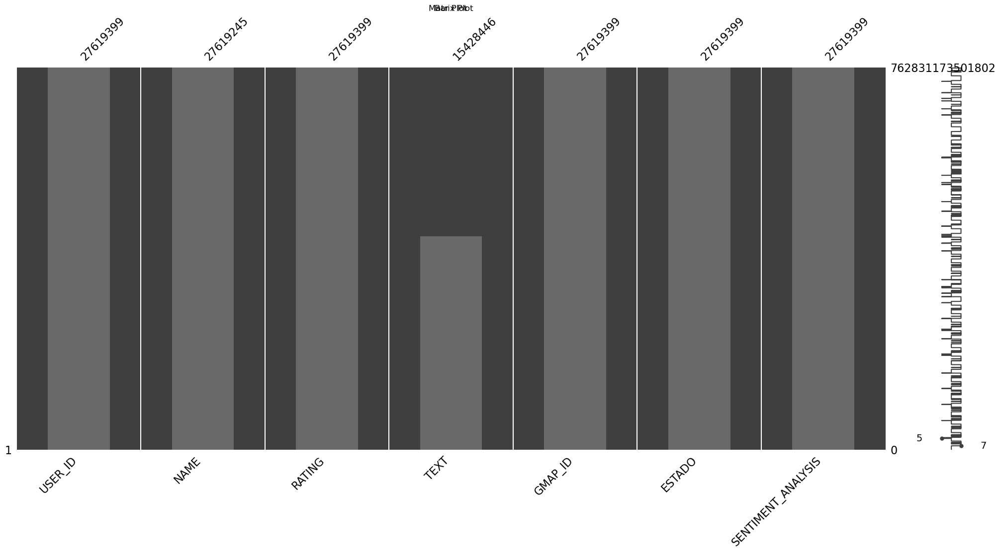

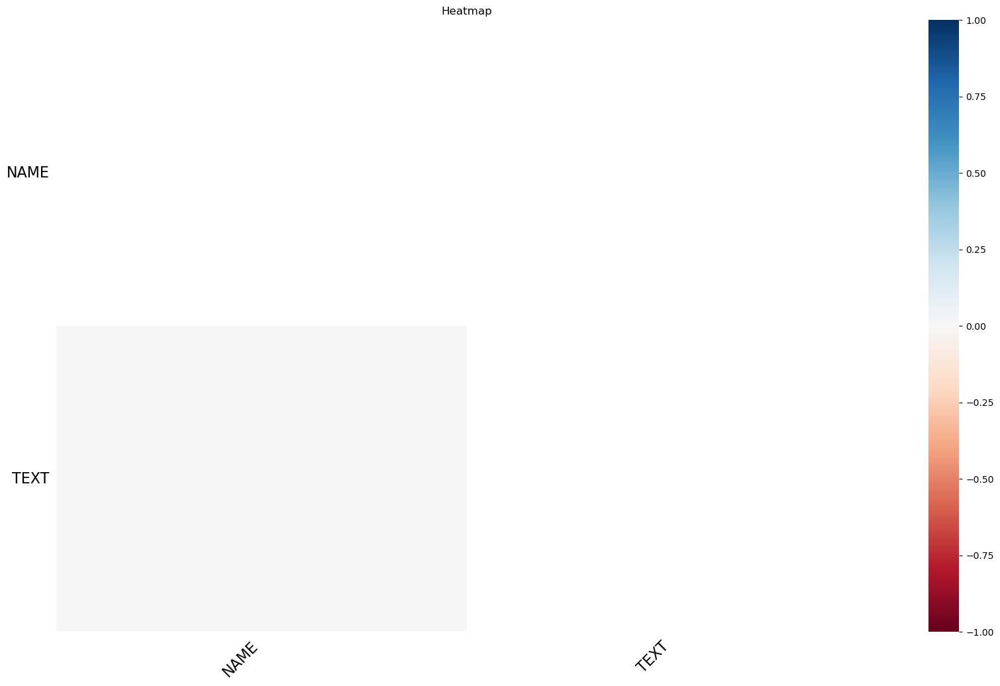

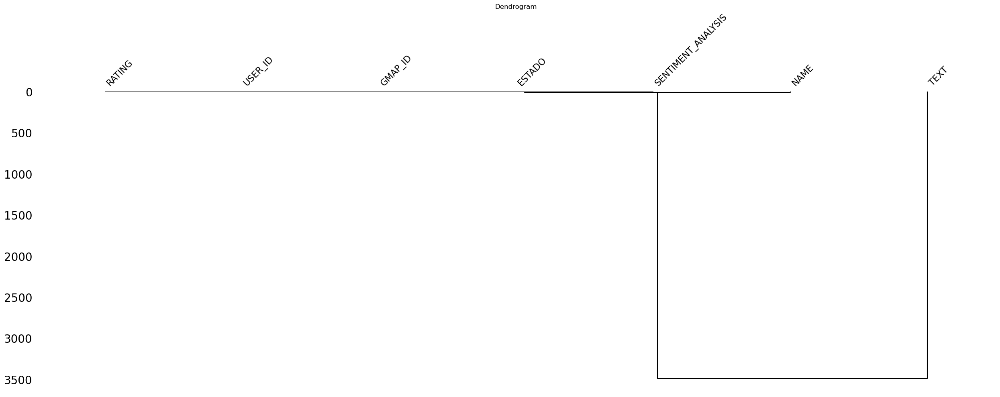

In [25]:
visualizar_nulos(df_ESTADOS)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 28, Finished, Available)

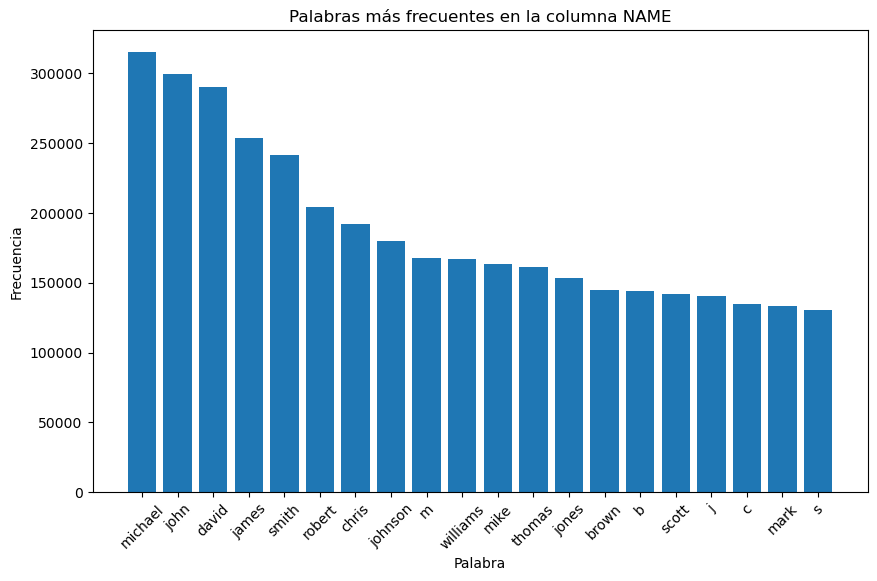

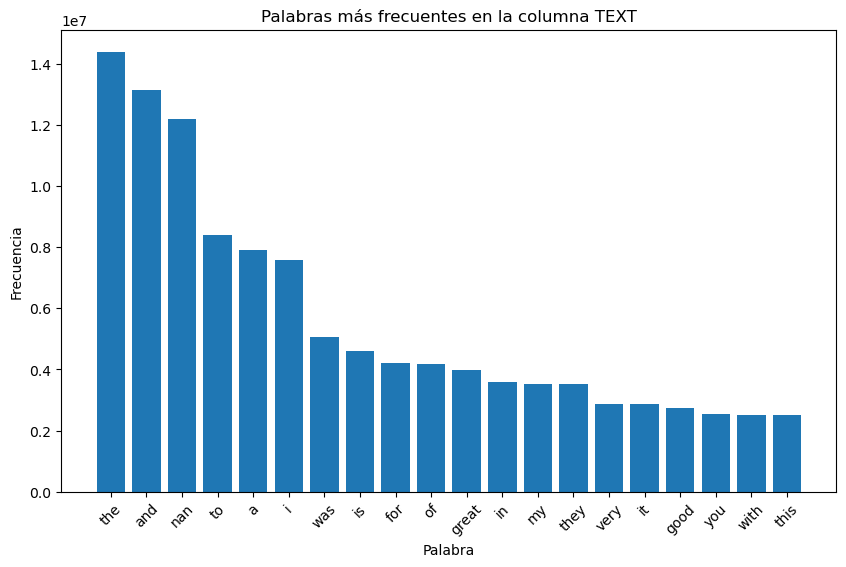

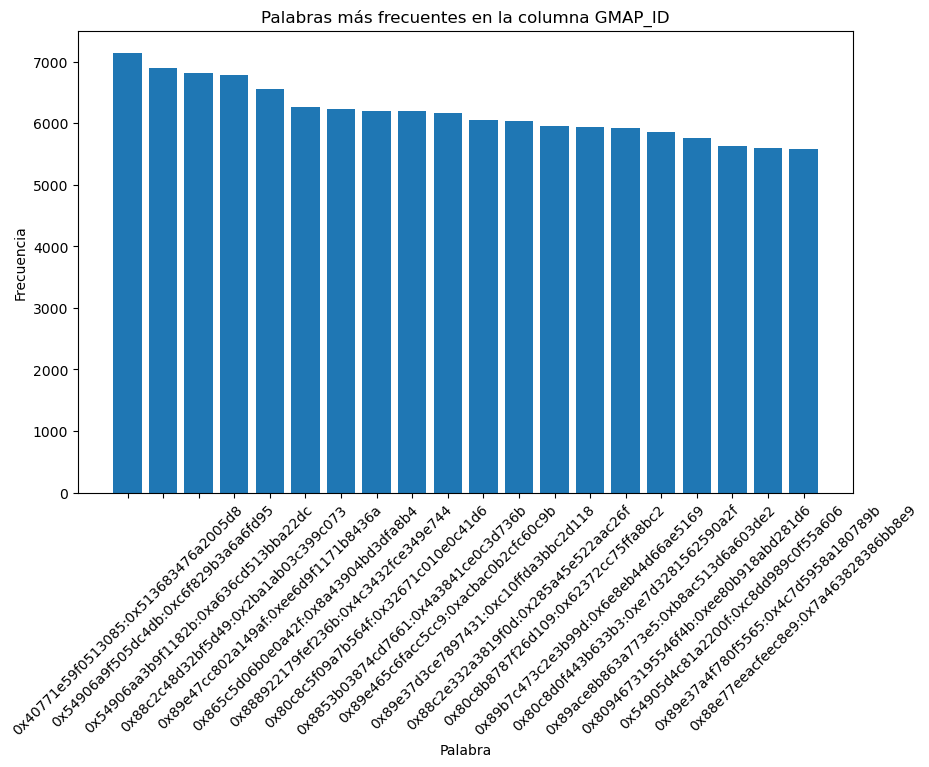

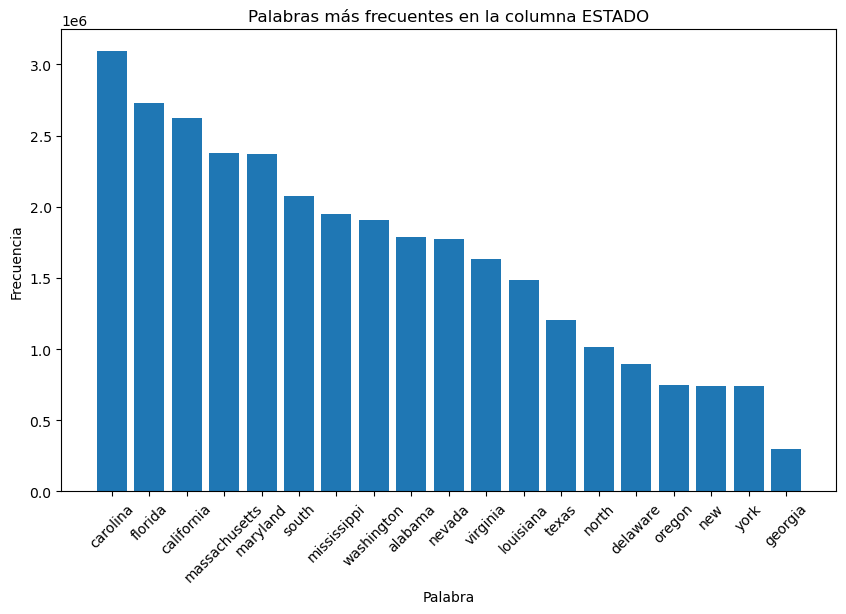

In [26]:
analisis_frecuencia_palabras(df_ESTADOS)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 29, Finished, Available)

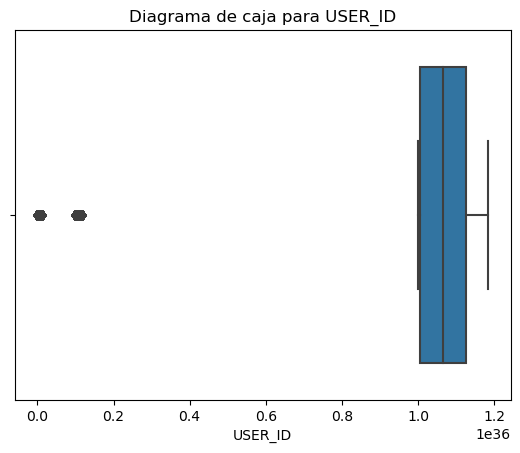

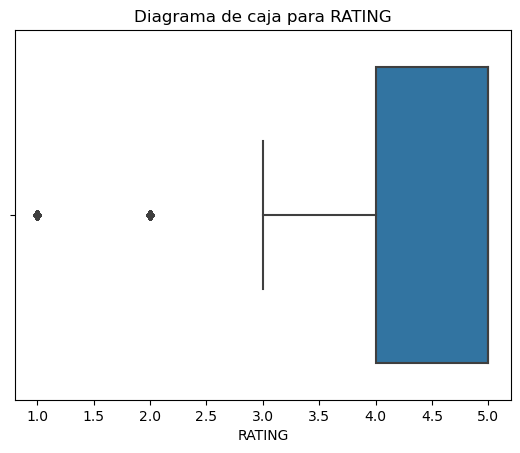

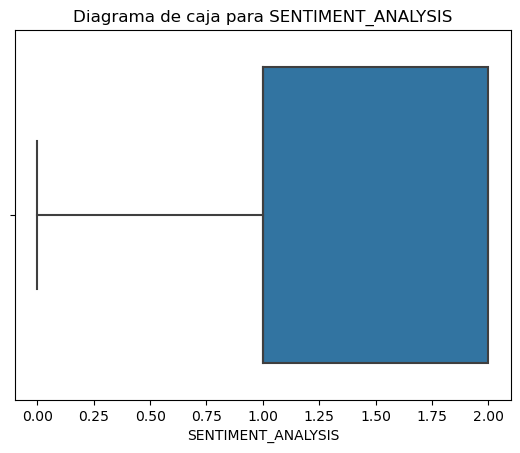

In [27]:
boxplots_numericas(df_ESTADOS)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 30, Finished, Available)

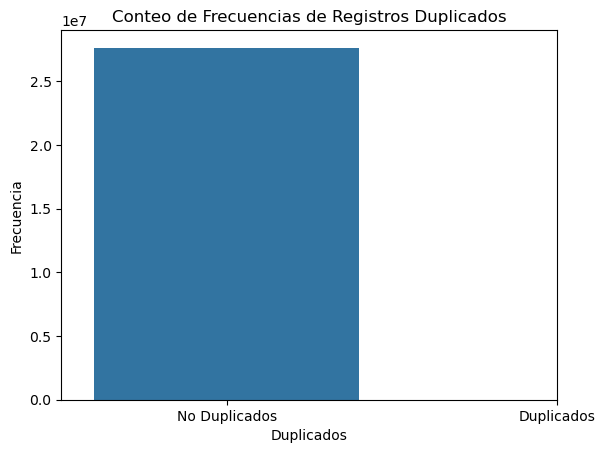

In [28]:
hist_duplicados(df_ESTADOS)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 31, Finished, Available)

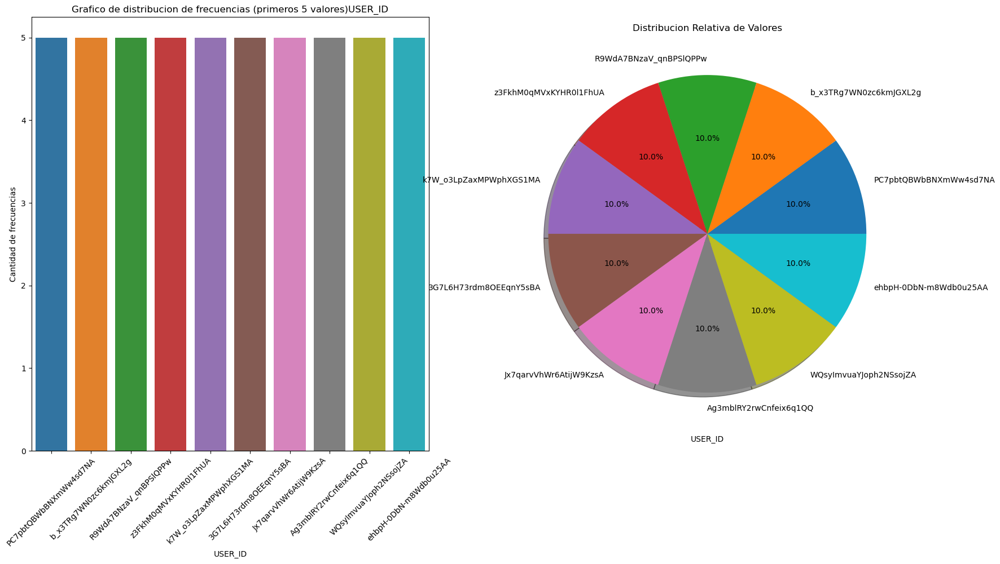



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




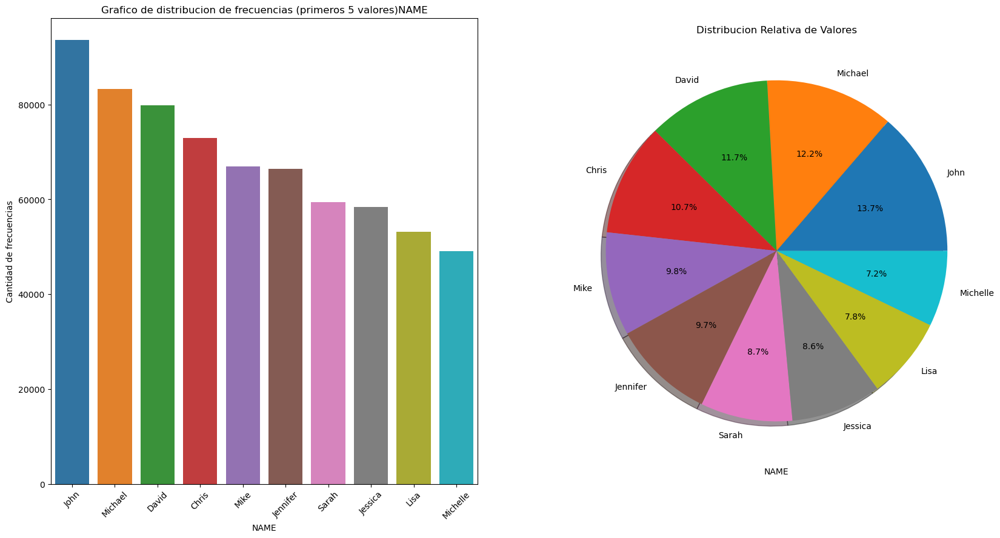



Estadisticas Basicas


count     9939300
unique     132358
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




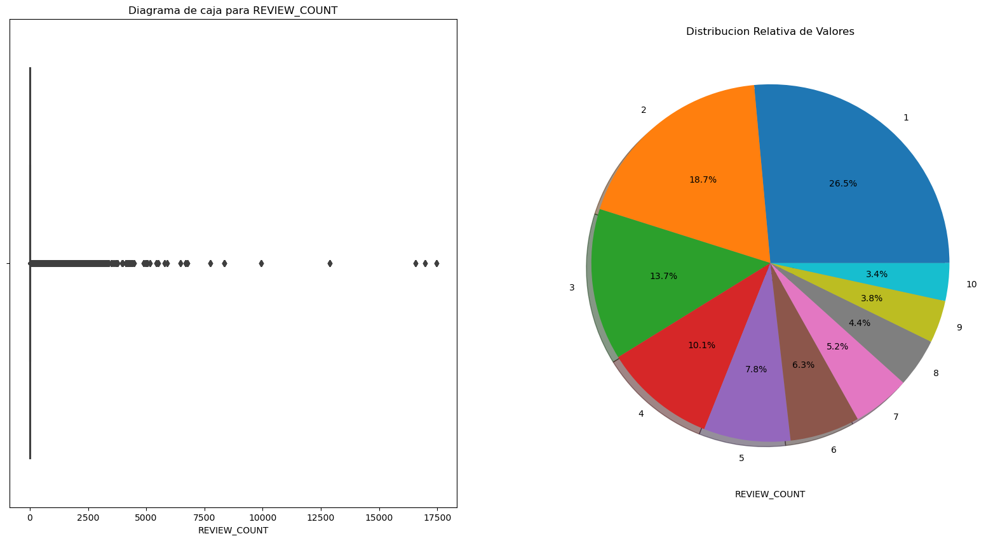



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




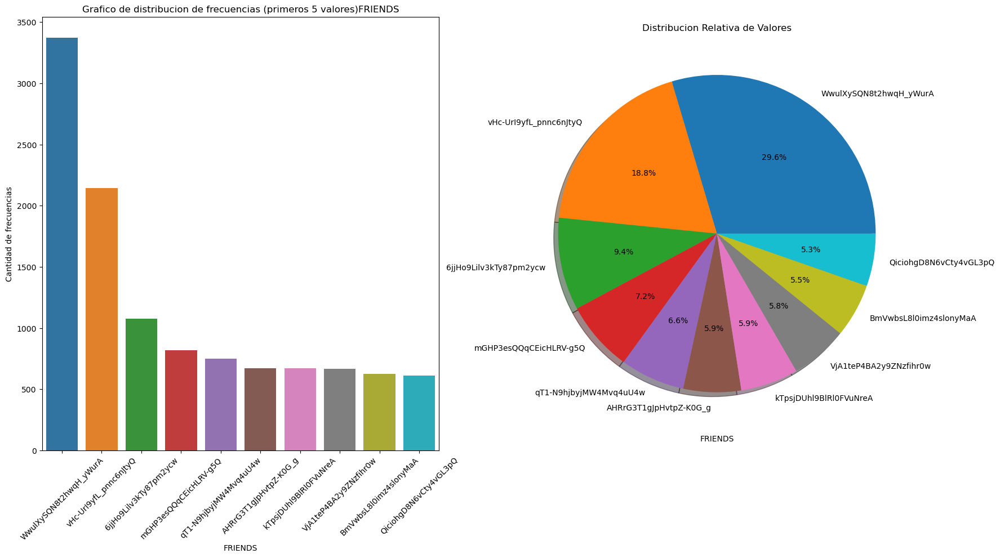



Estadisticas Basicas


count                    5546730
unique                   1091998
top       WwulXySQN8t2hwqH_yWurA
freq                        3375
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [29]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

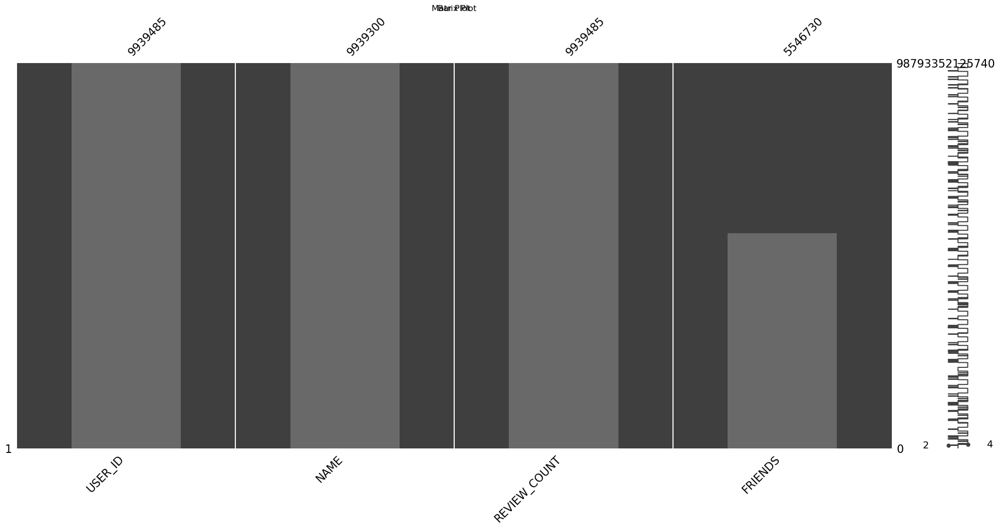

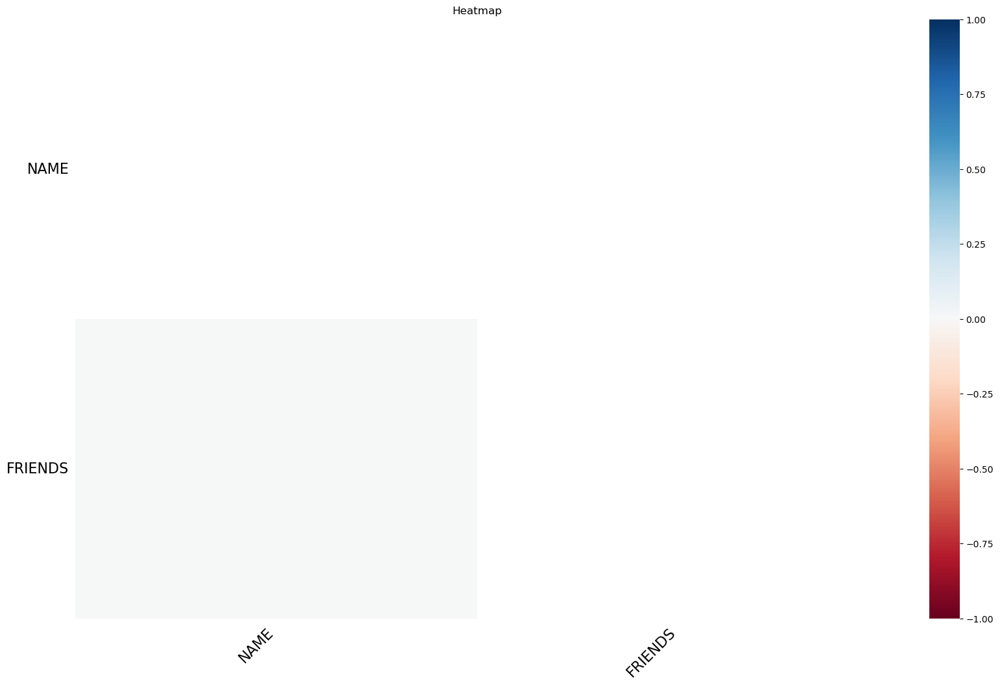

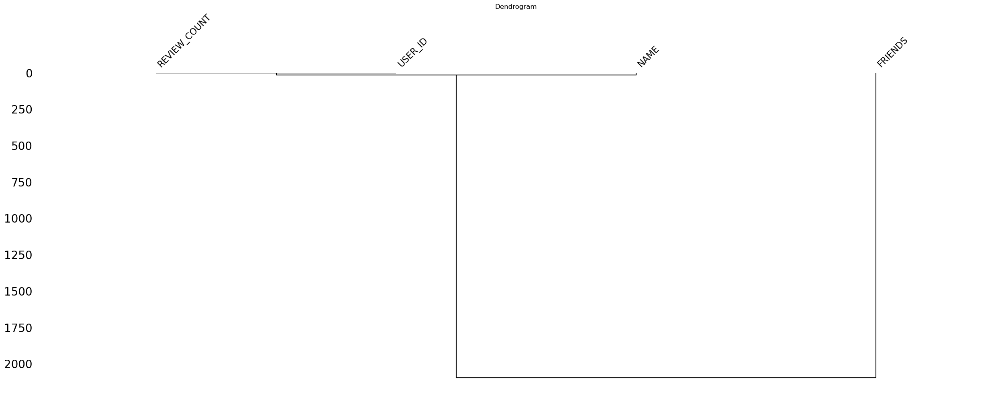

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

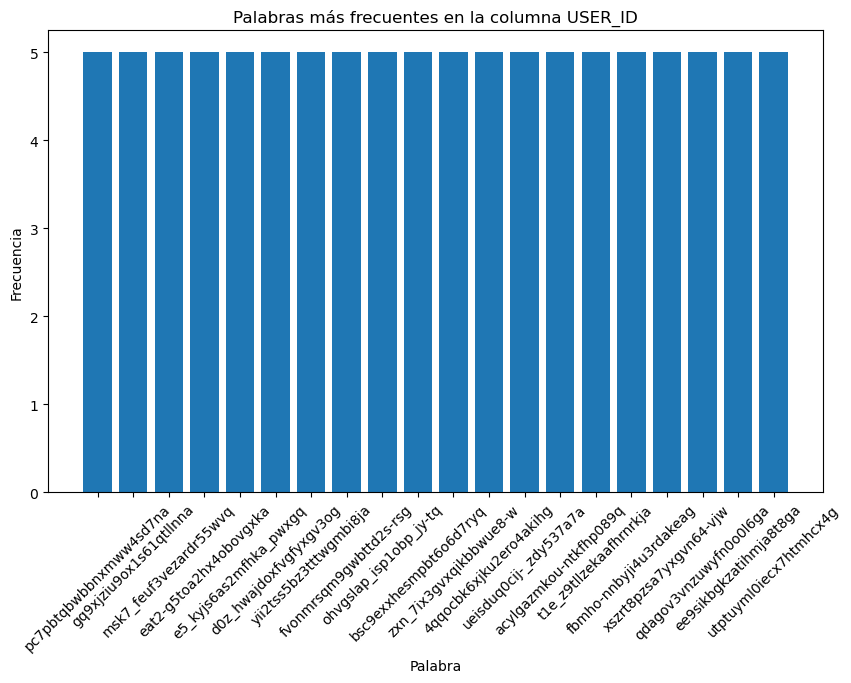

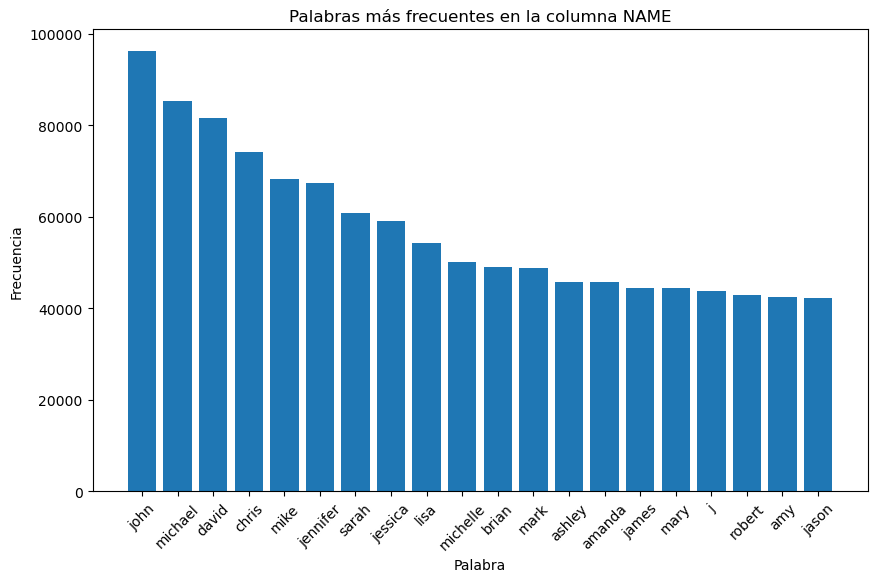

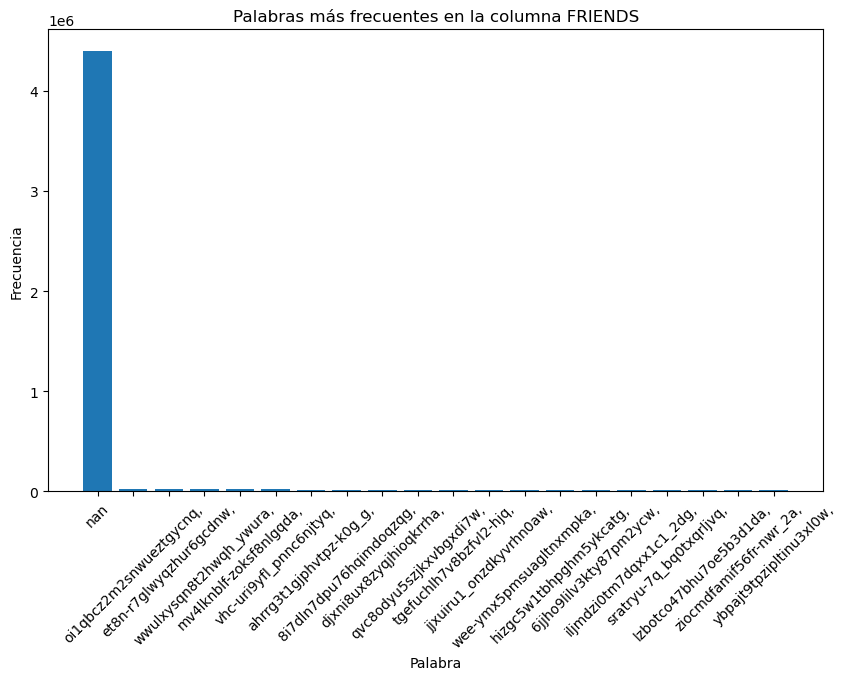

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

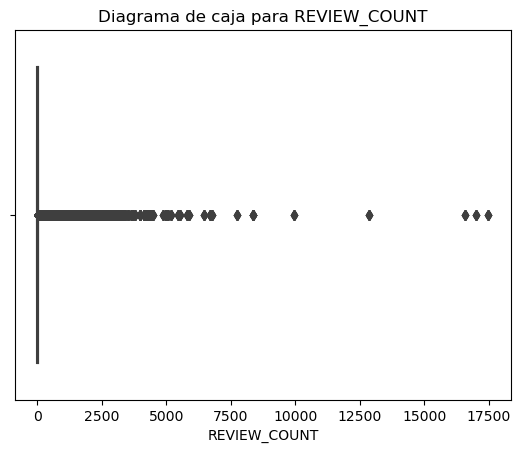

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

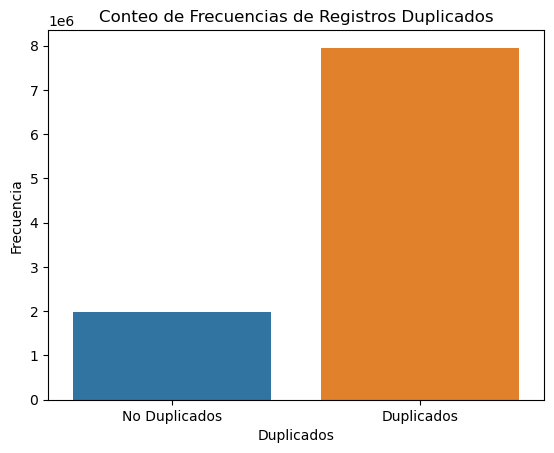

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

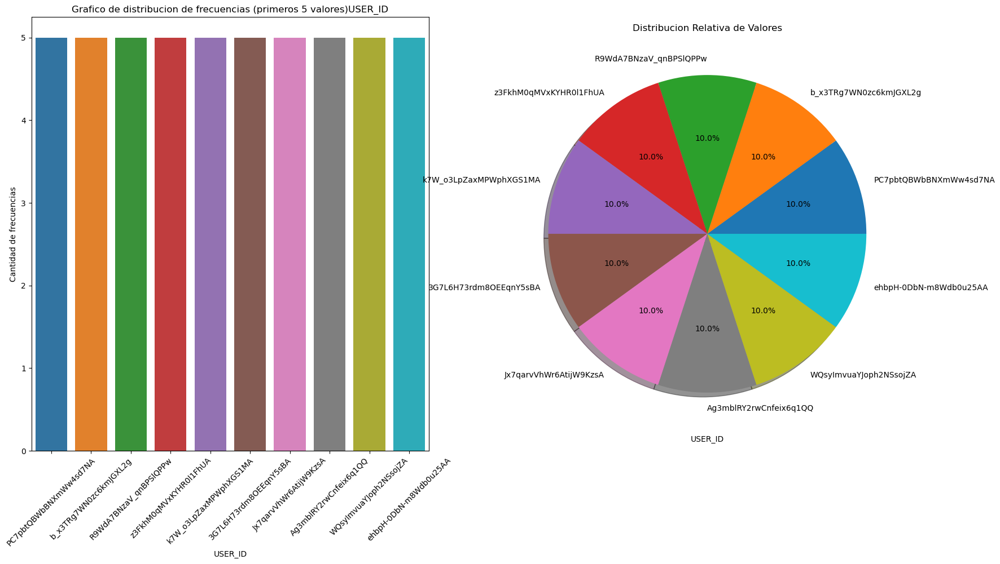



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




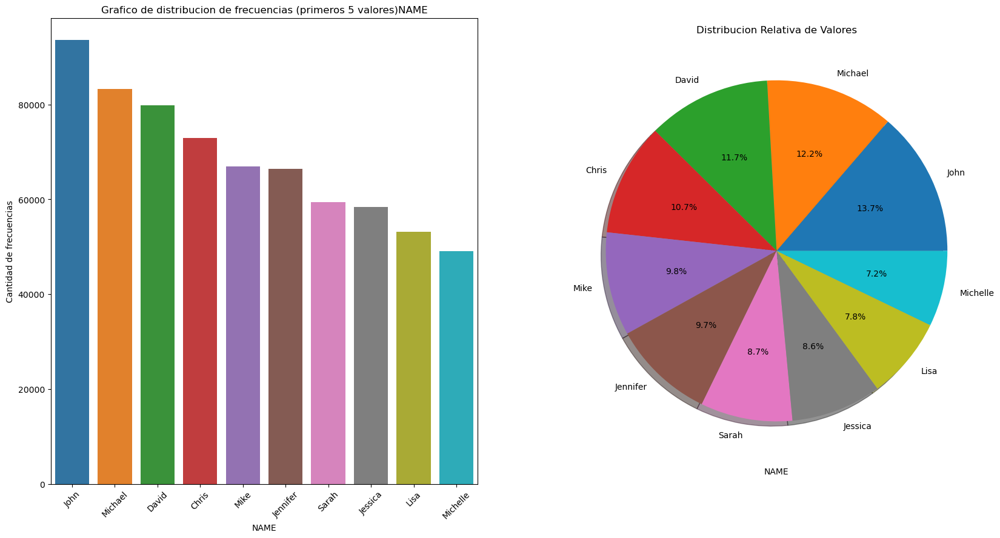



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




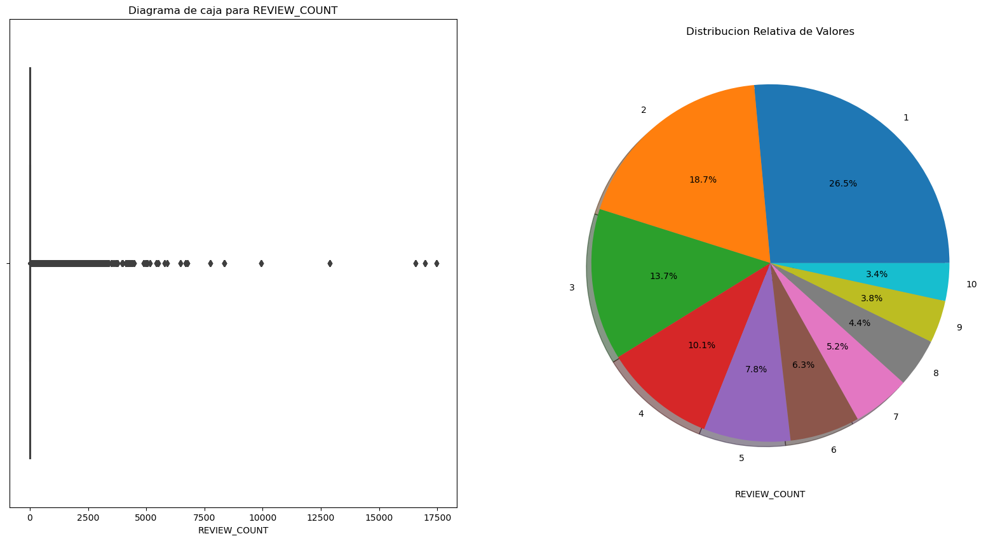



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




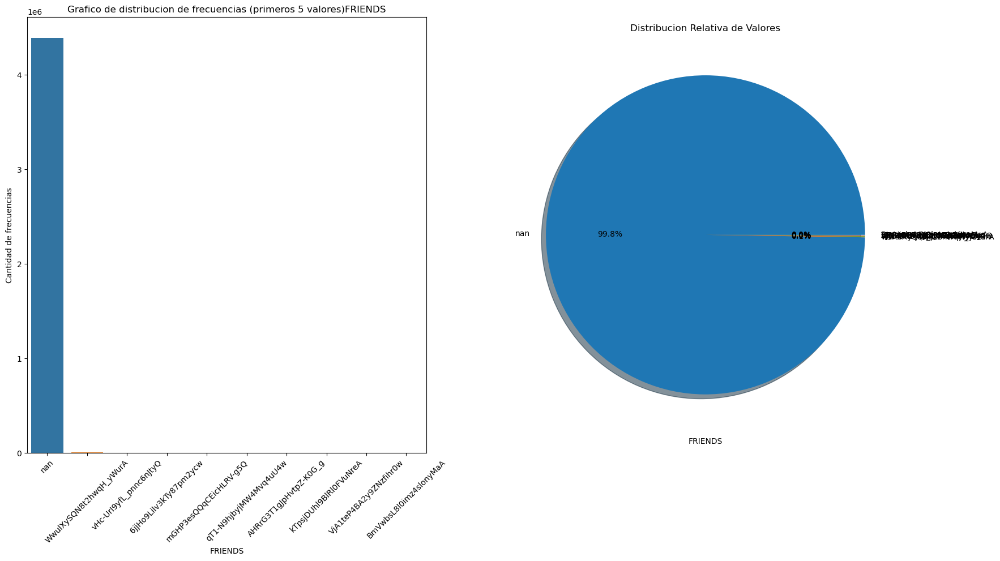



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

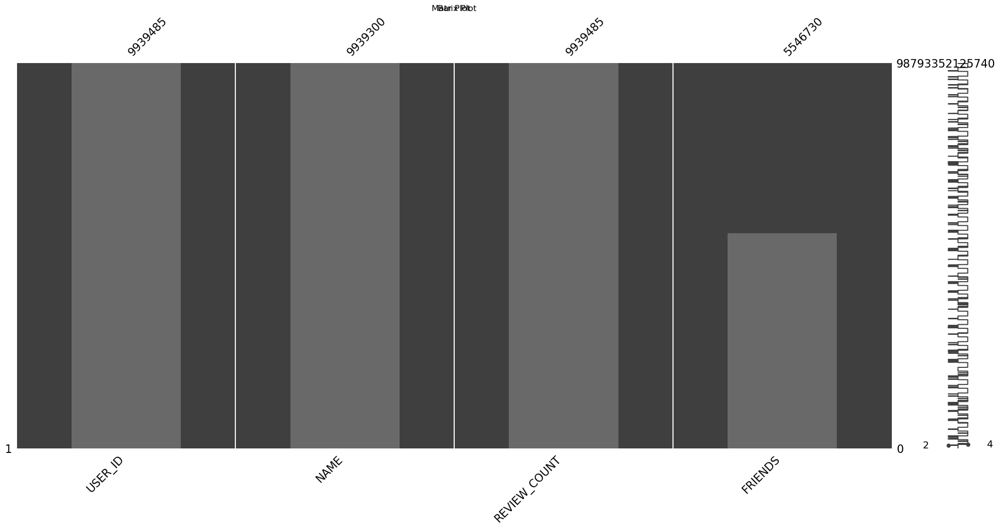

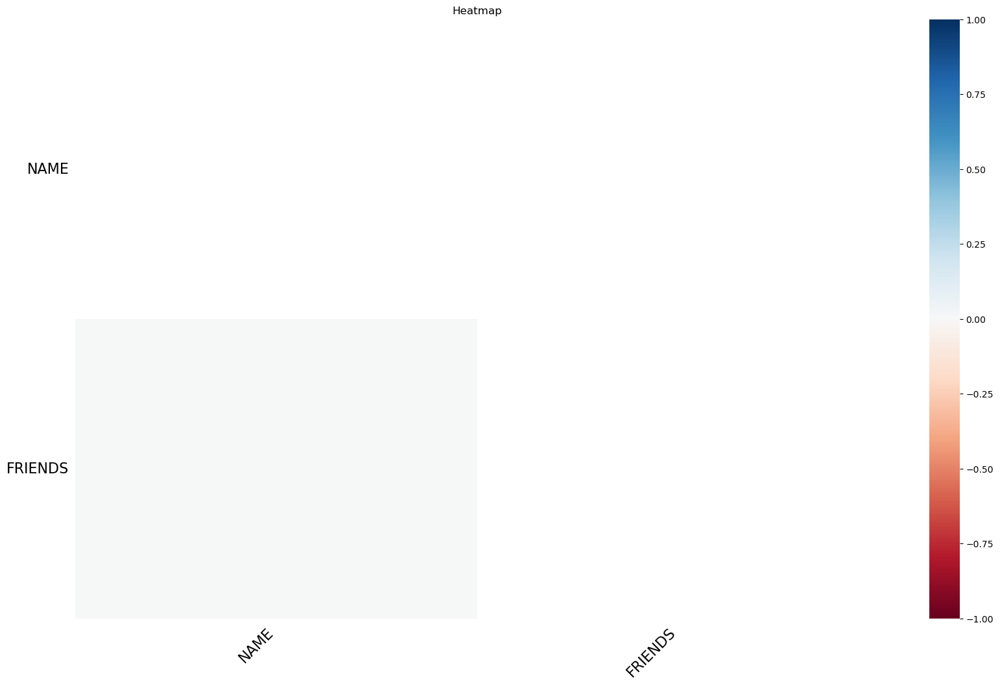

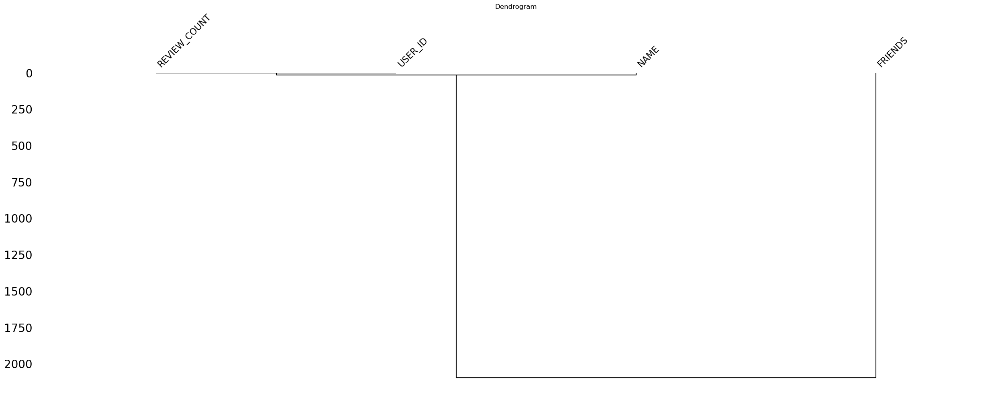

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

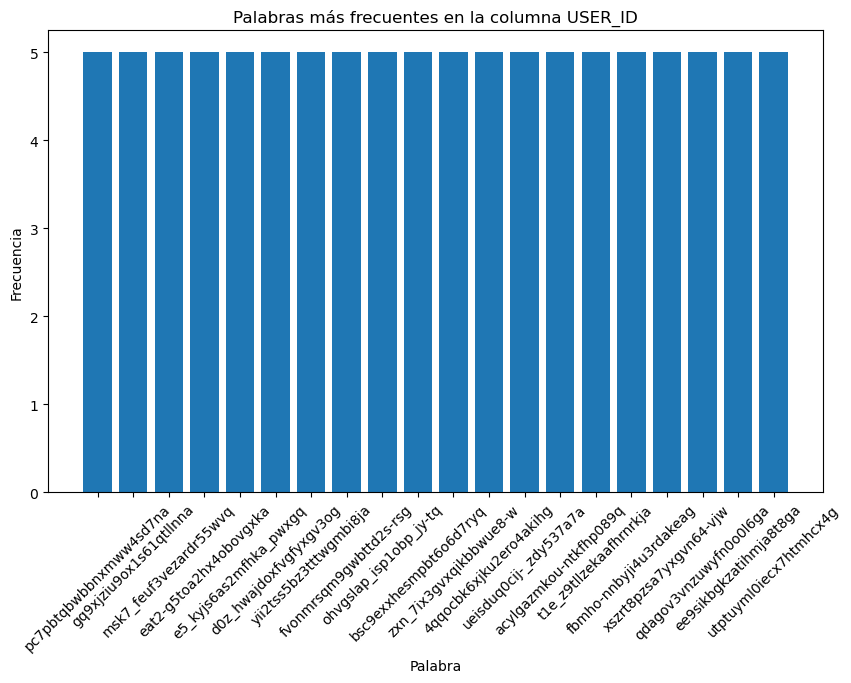

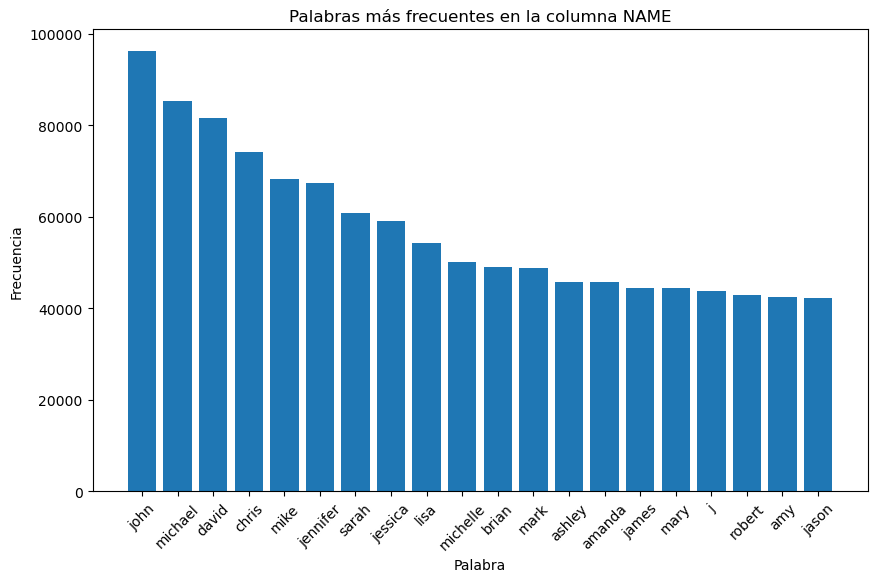

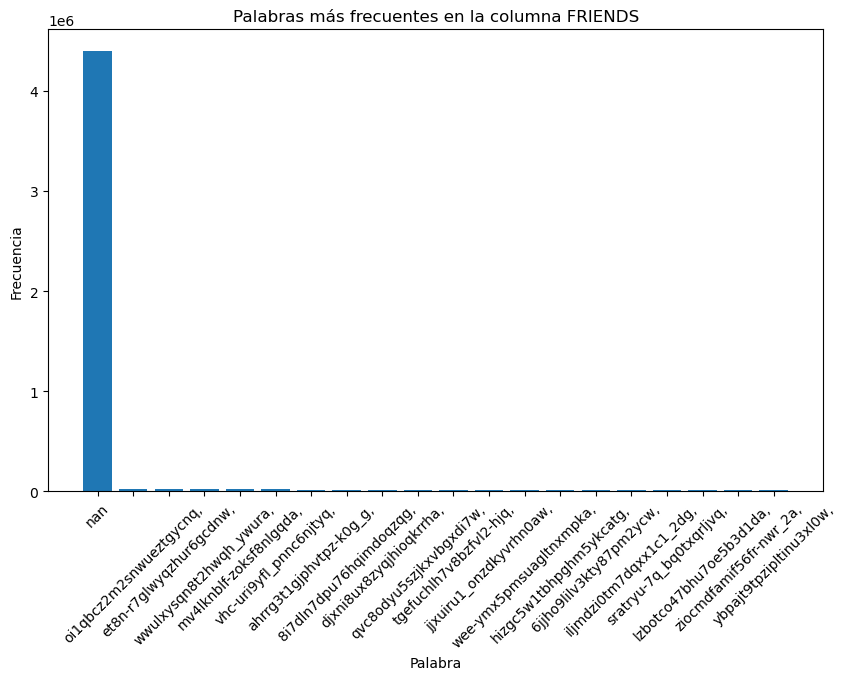

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

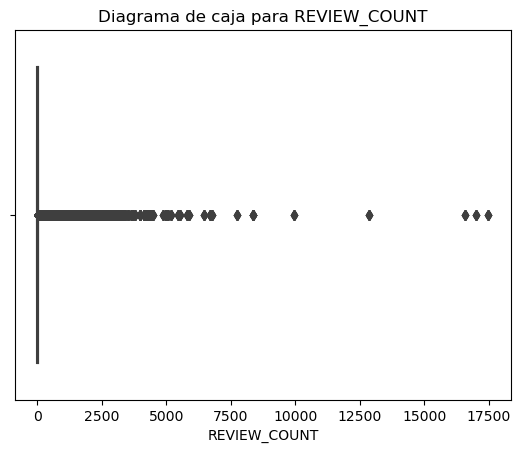

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

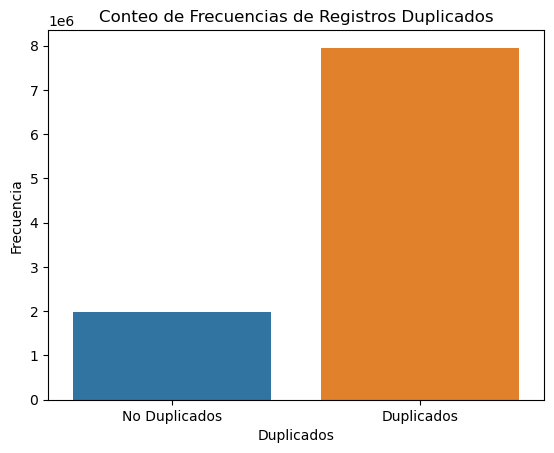

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

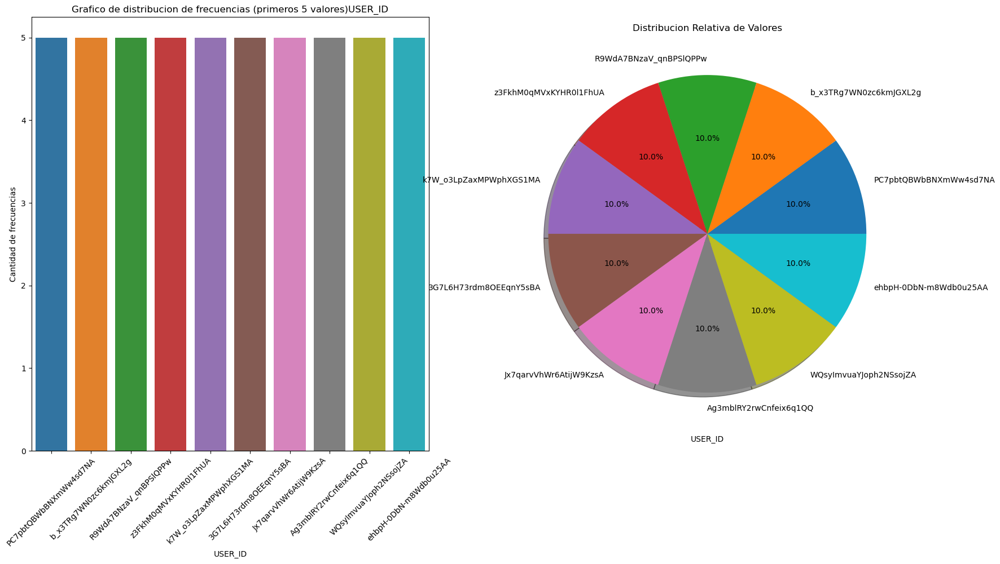



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




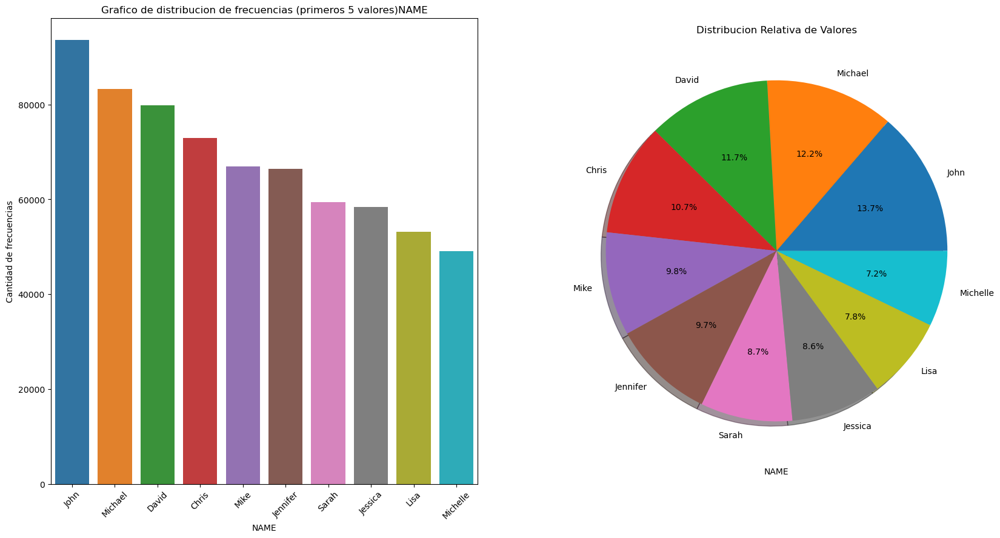



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




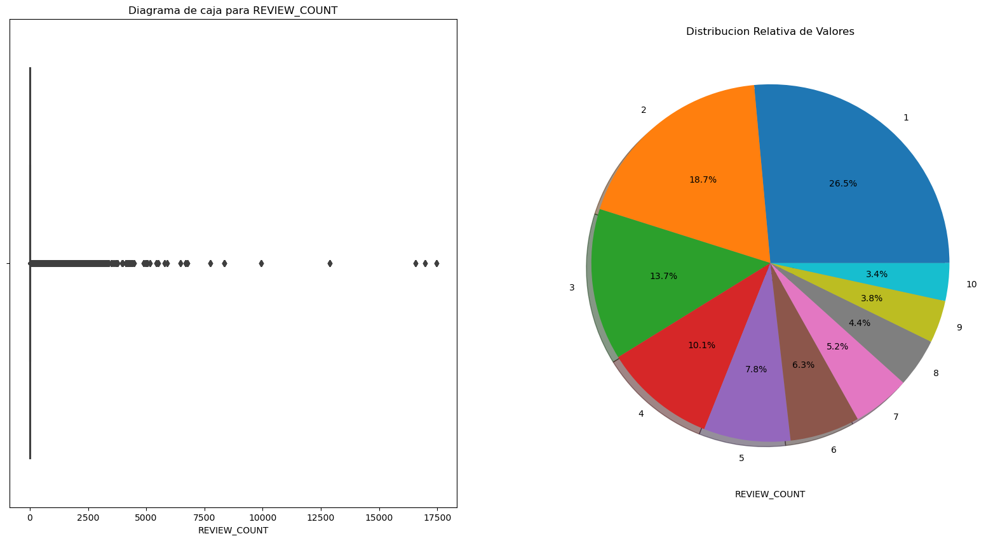



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




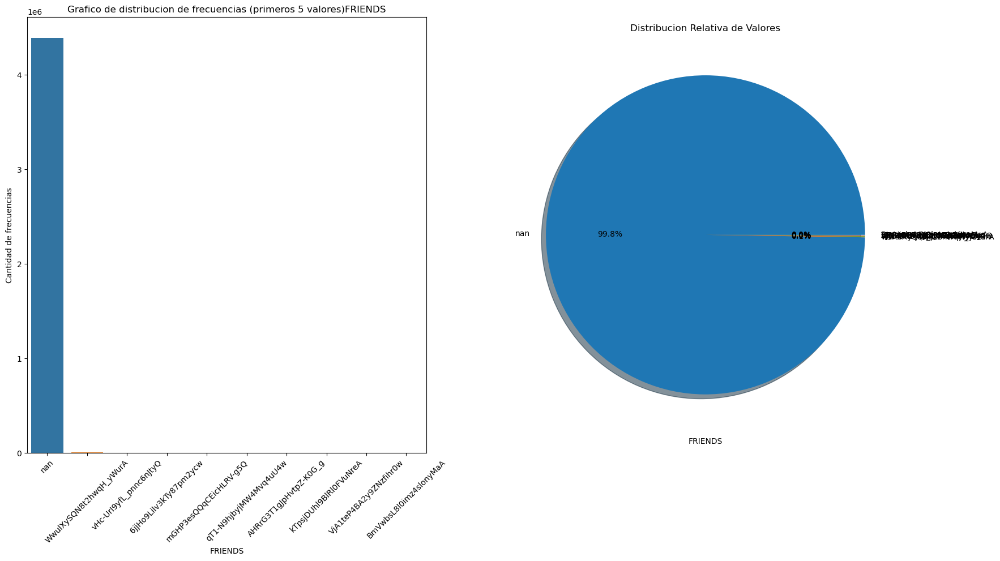



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

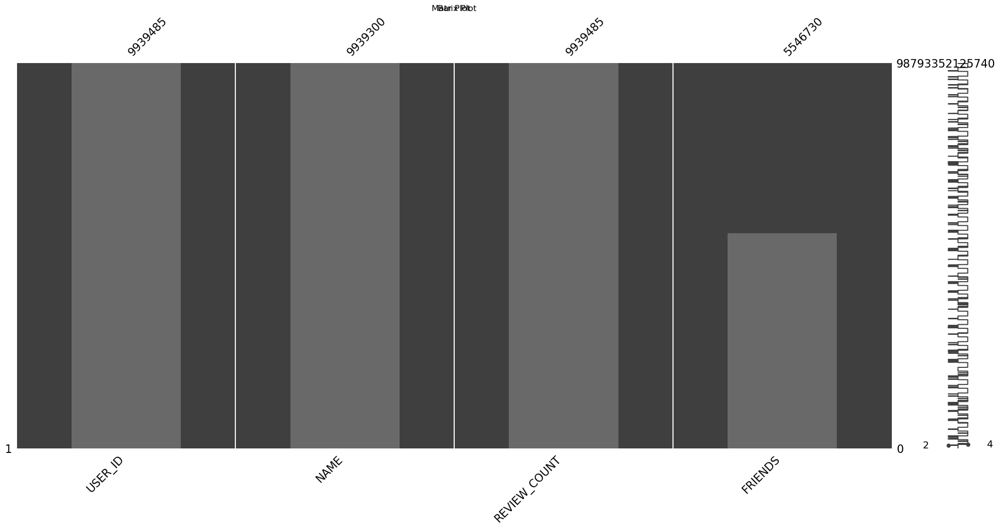

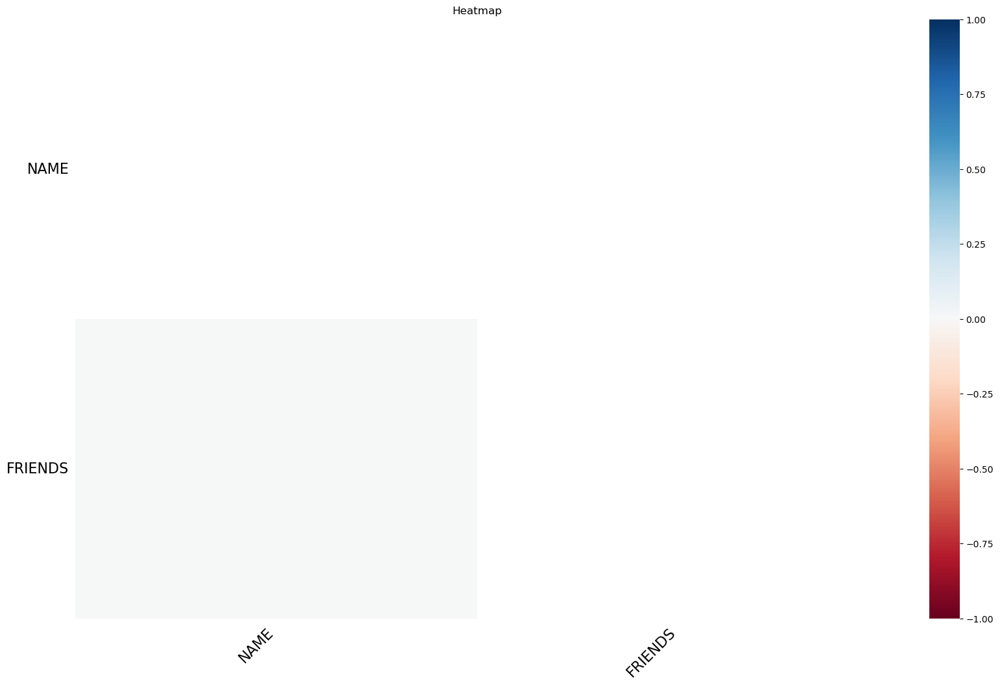

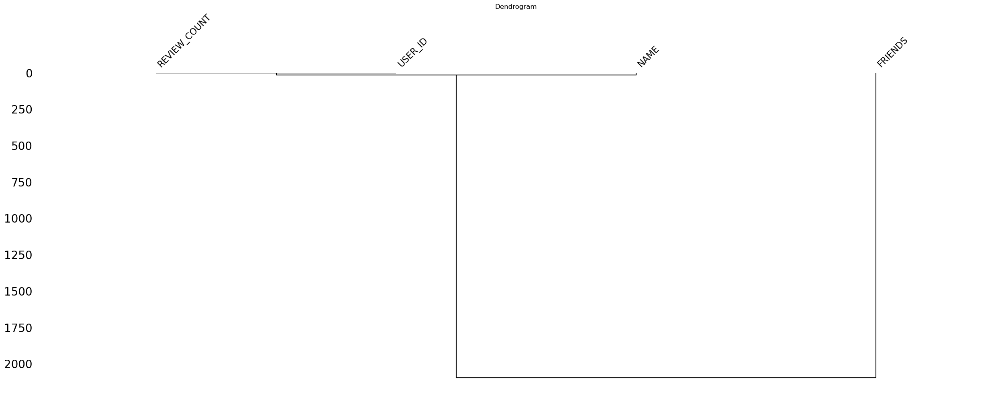

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

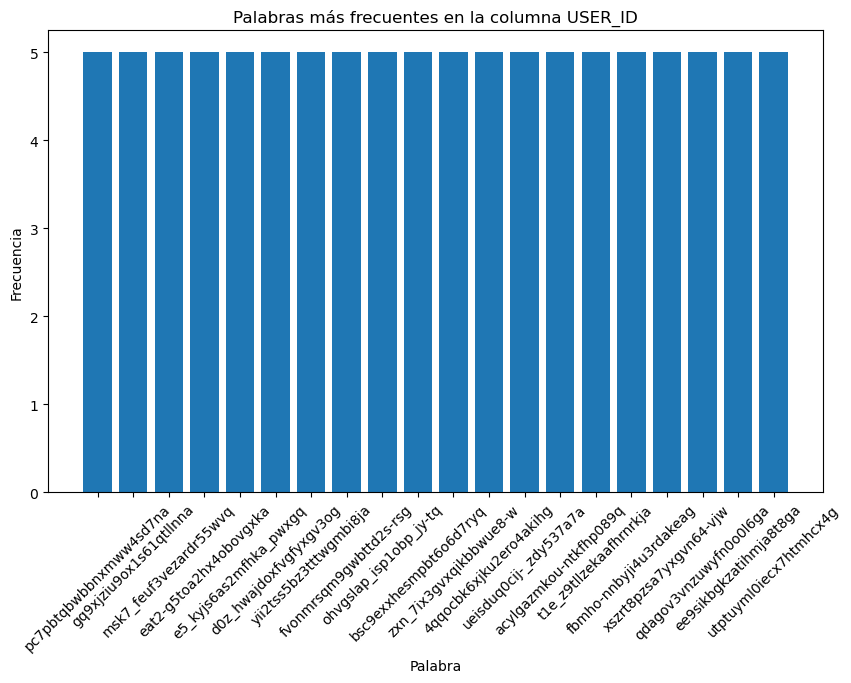

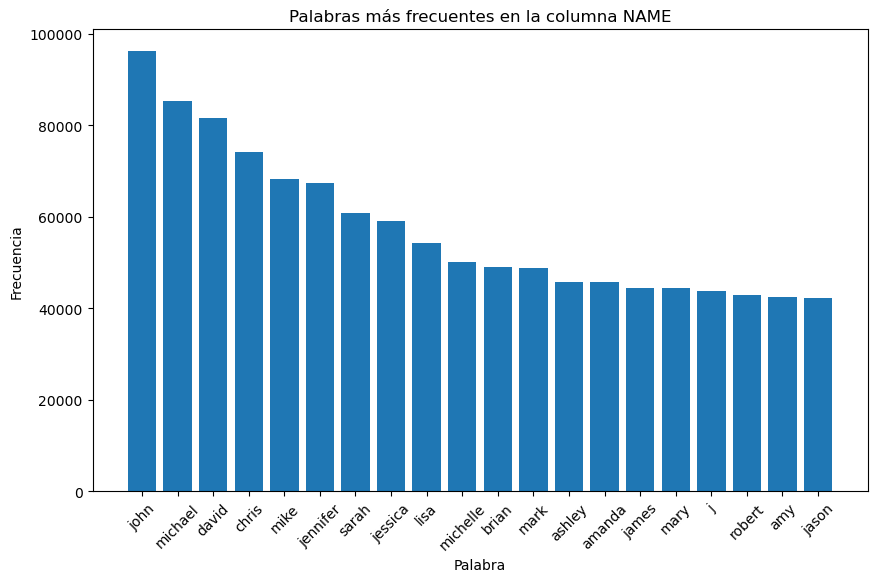

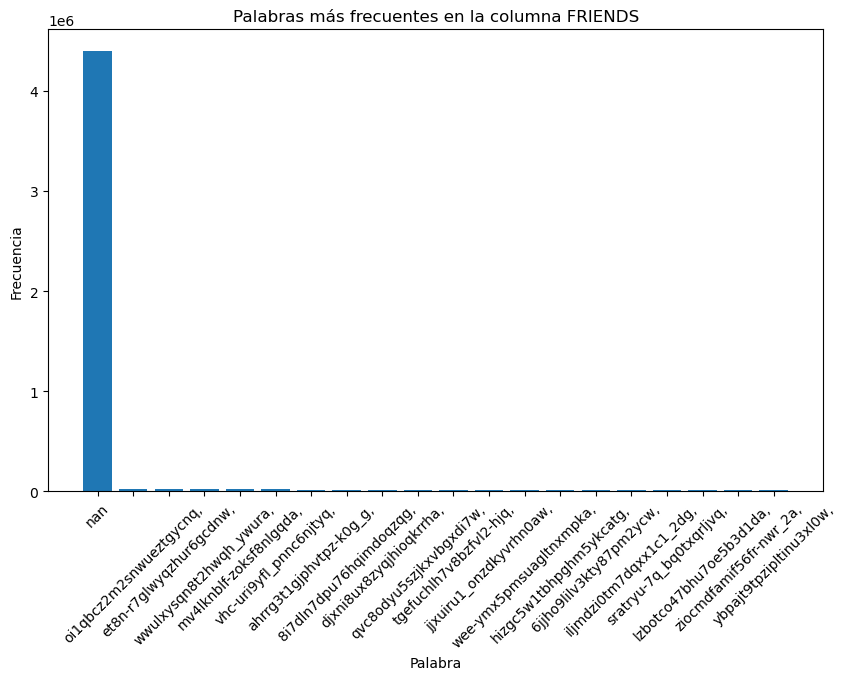

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

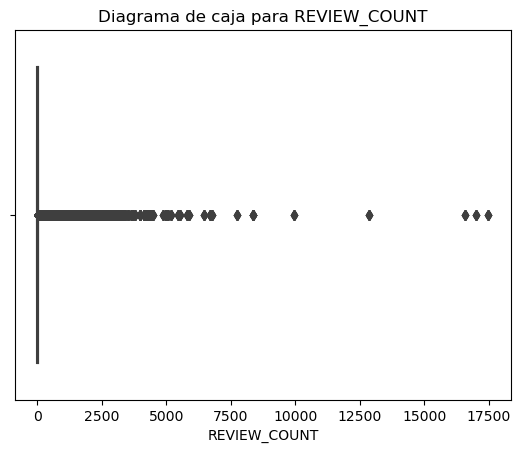

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

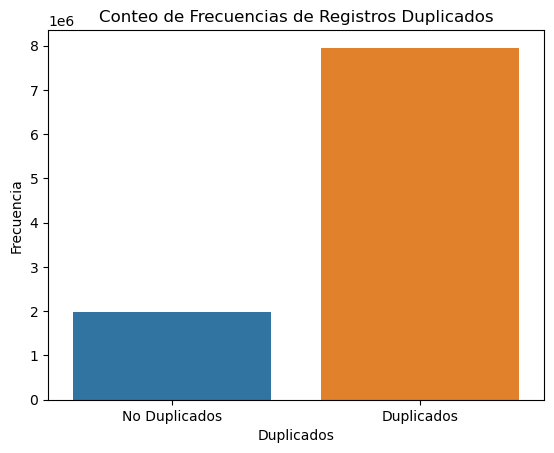

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

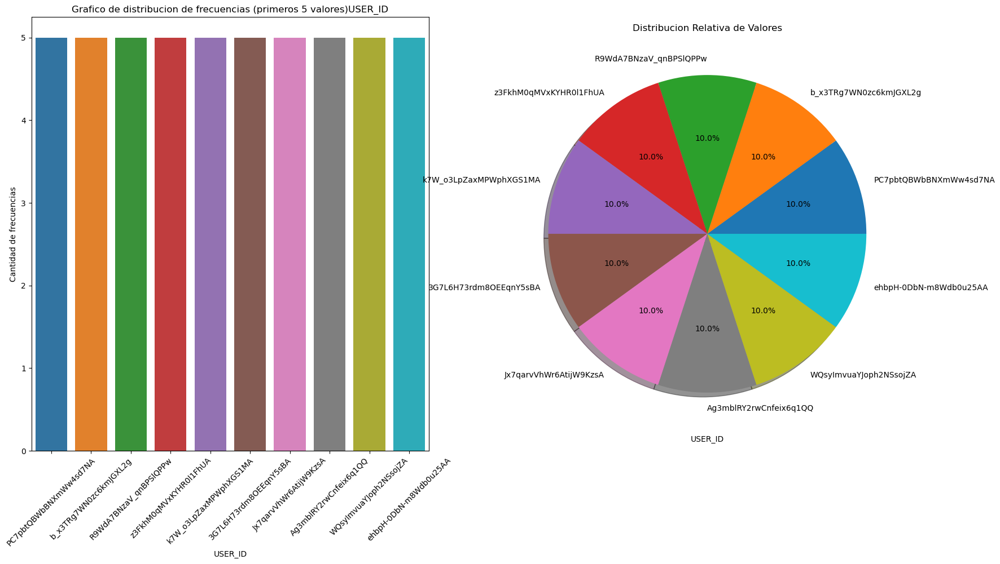



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




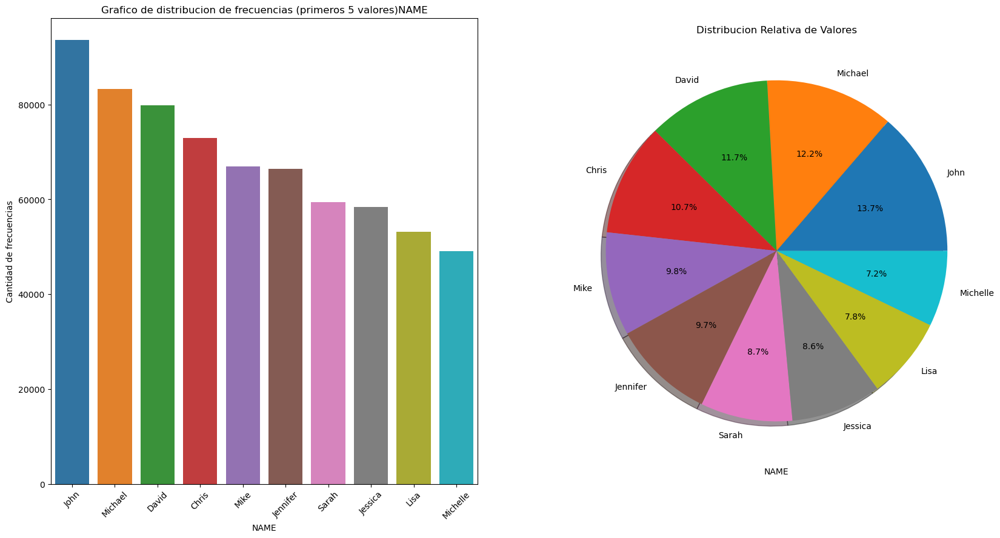



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




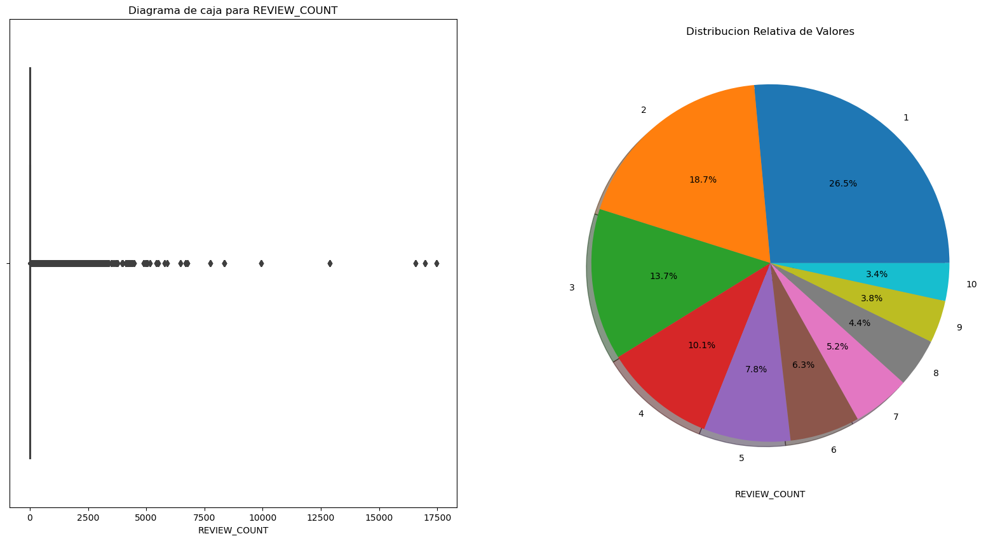



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




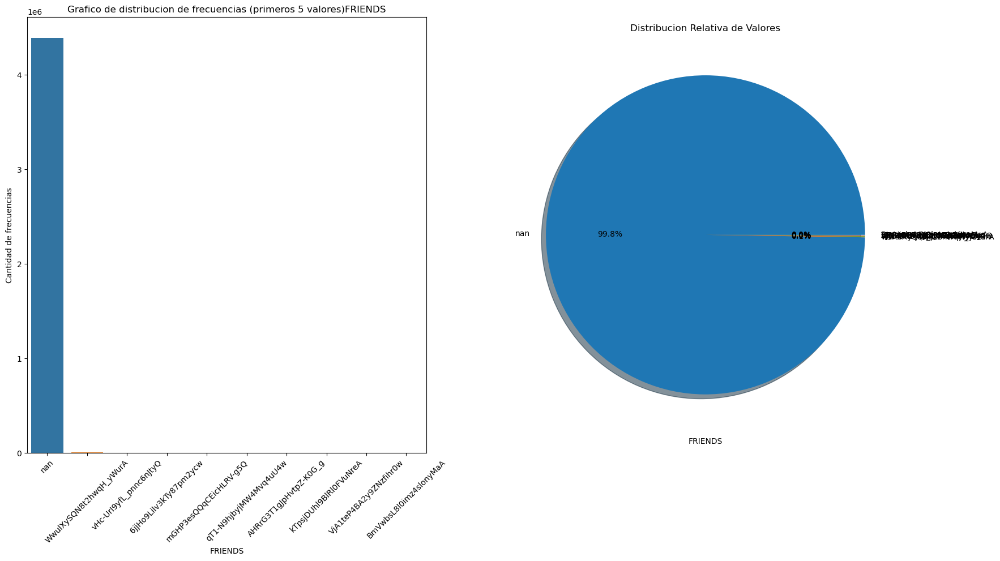



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

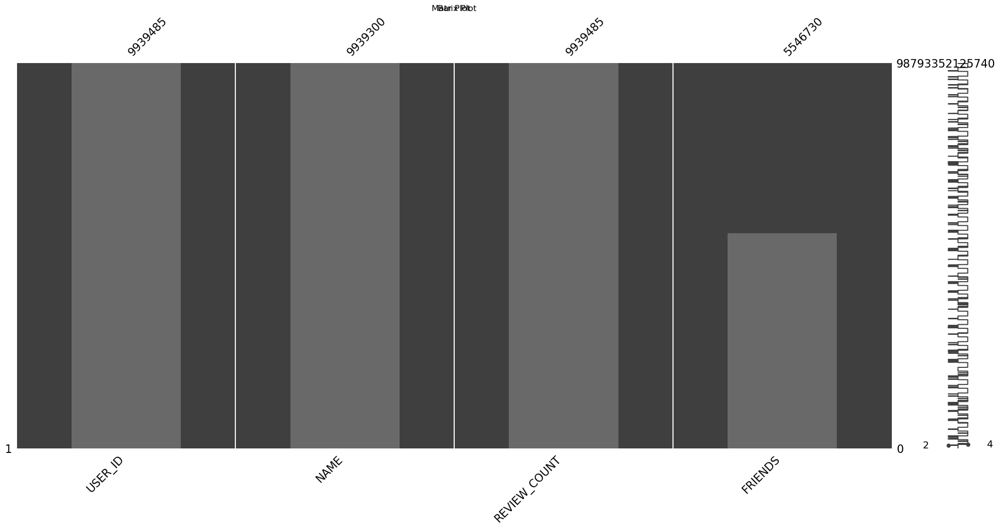

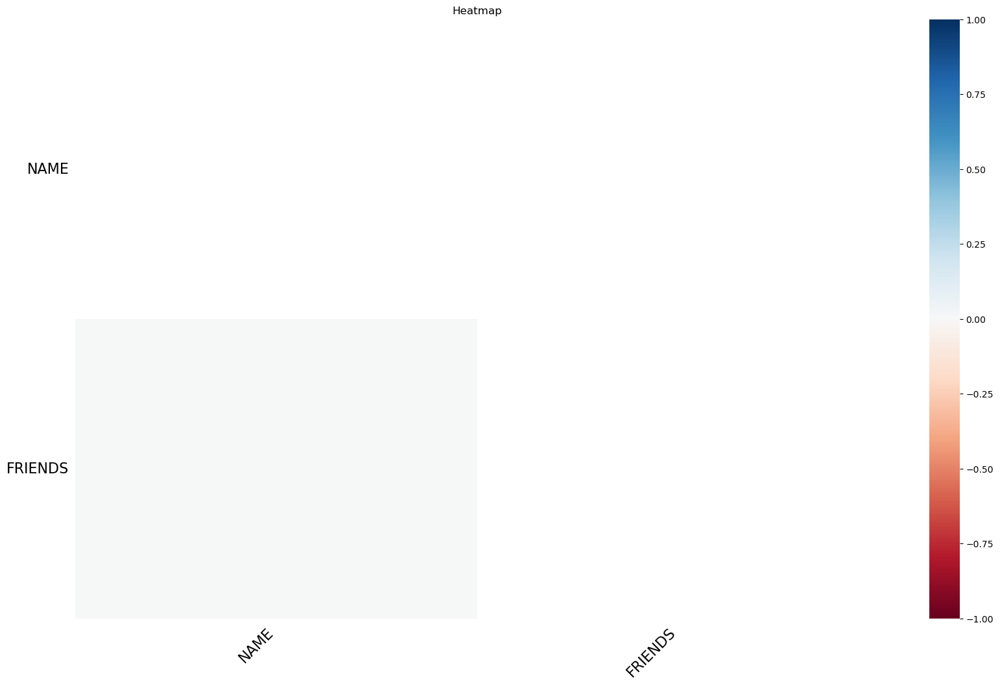

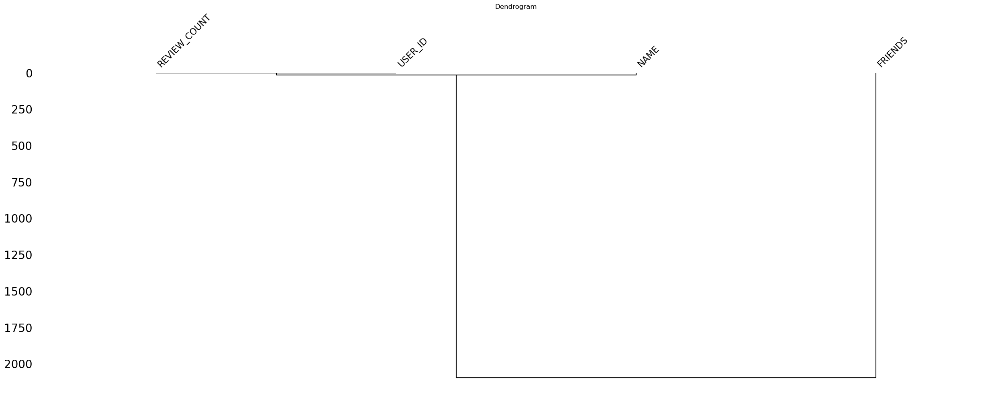

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

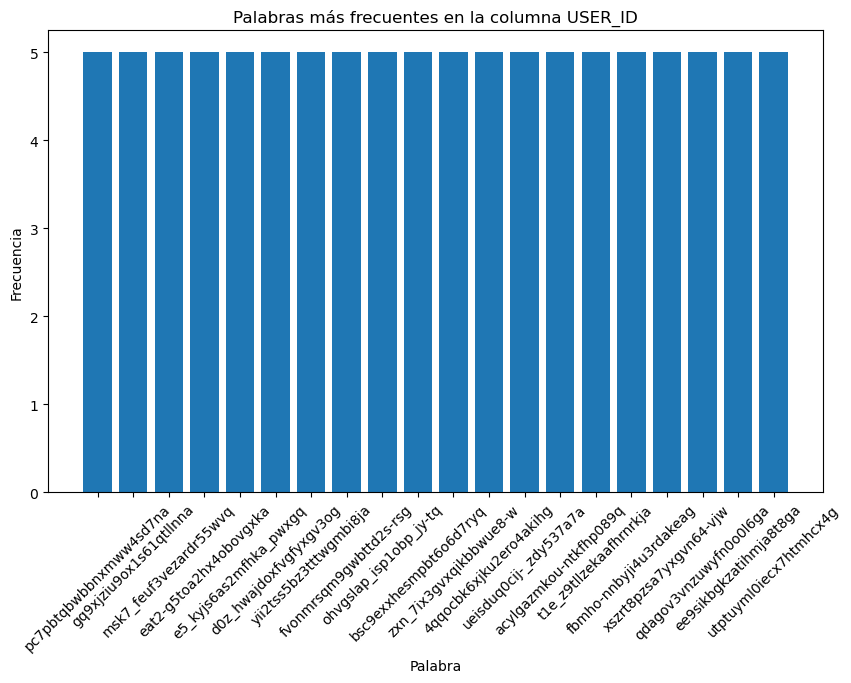

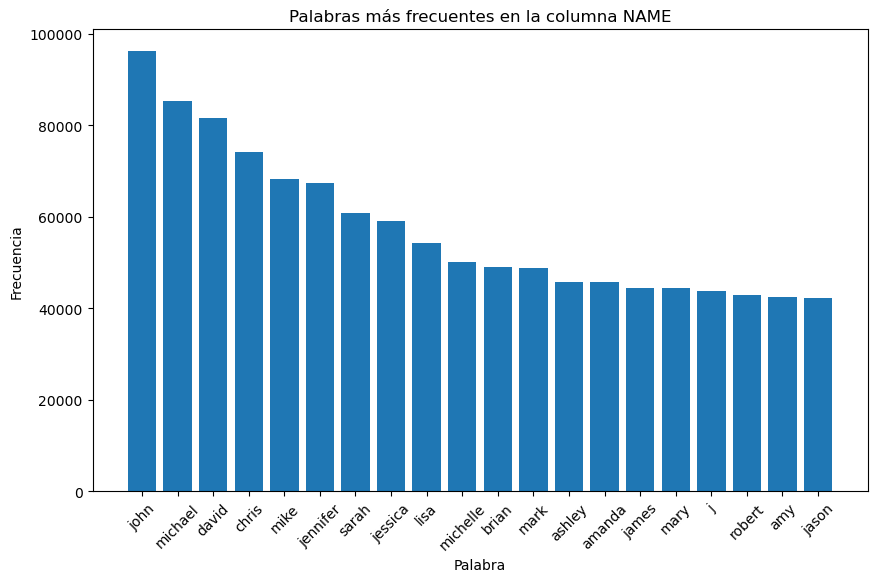

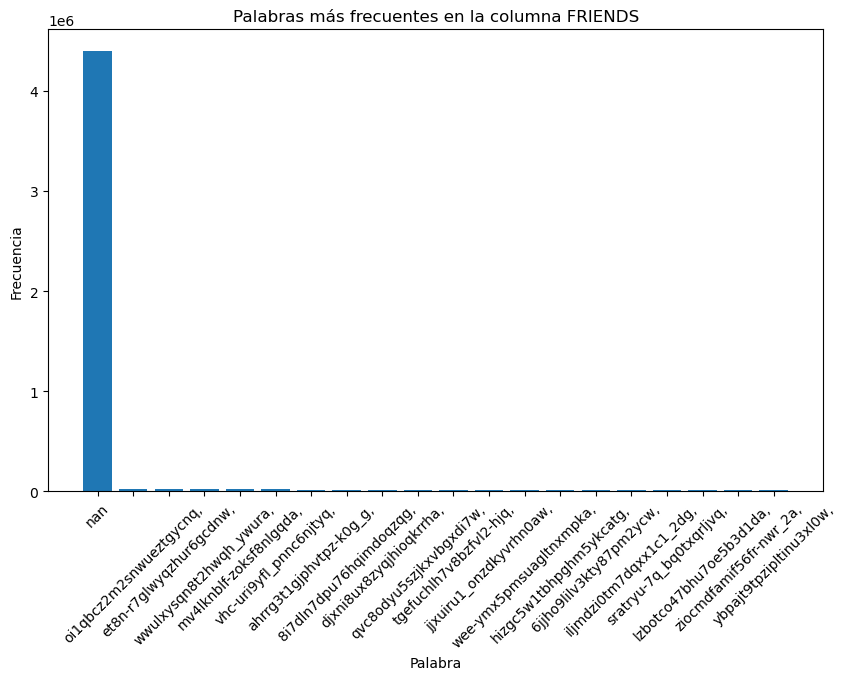

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

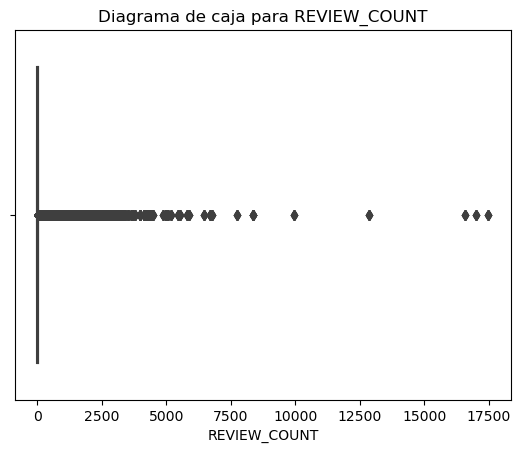

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

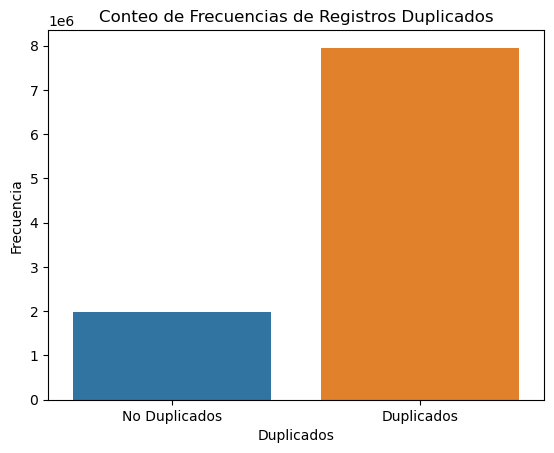

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

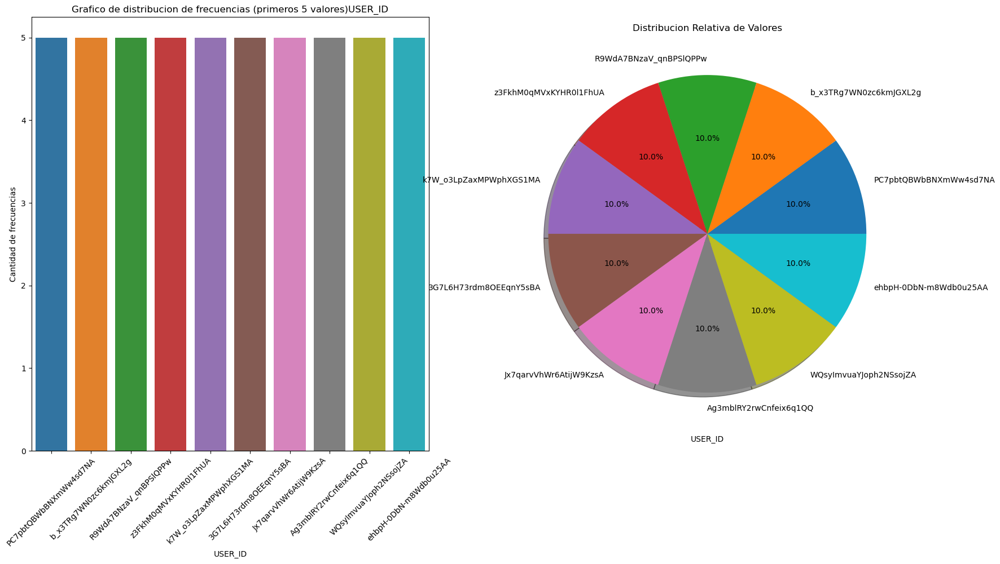



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




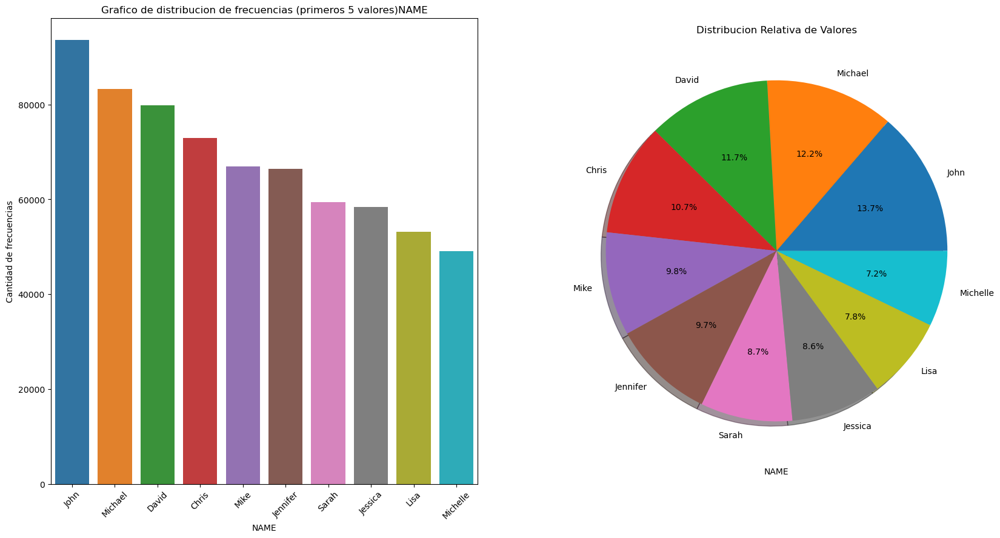



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




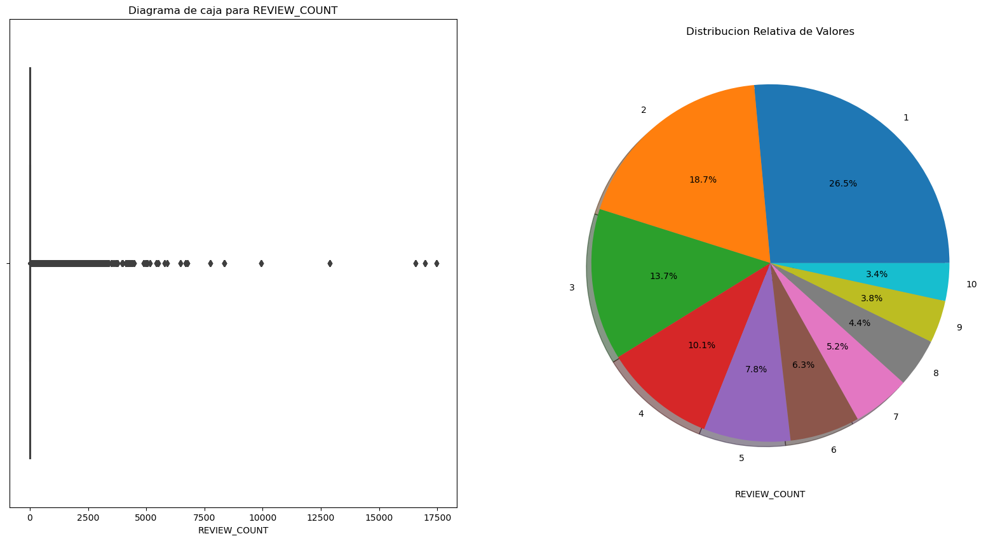



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




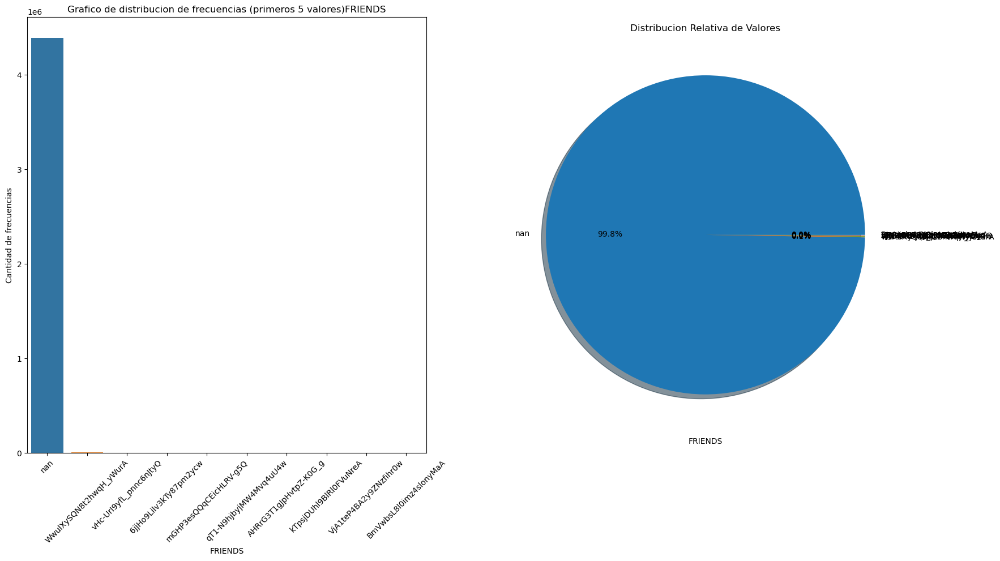



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

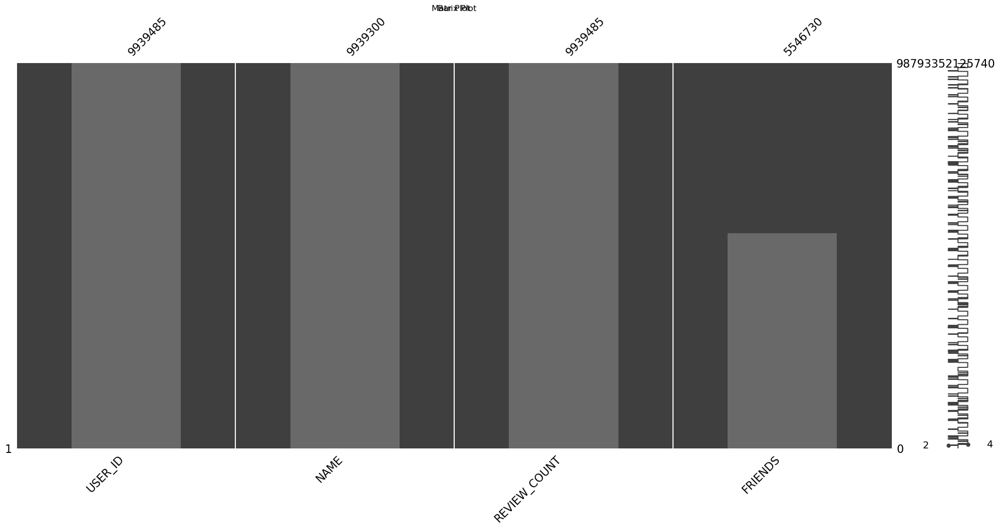

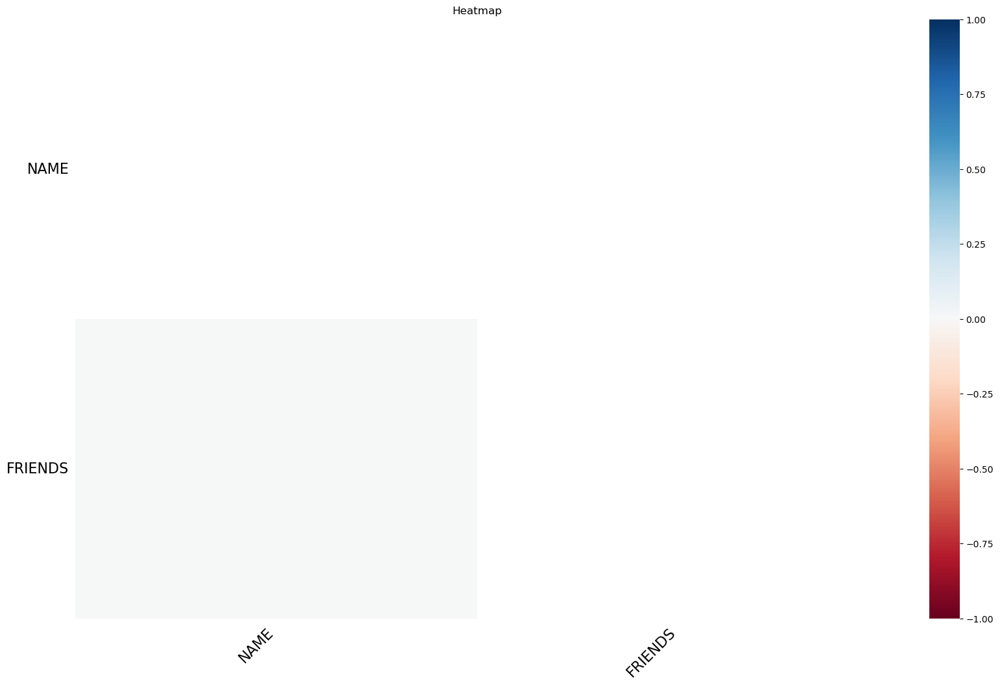

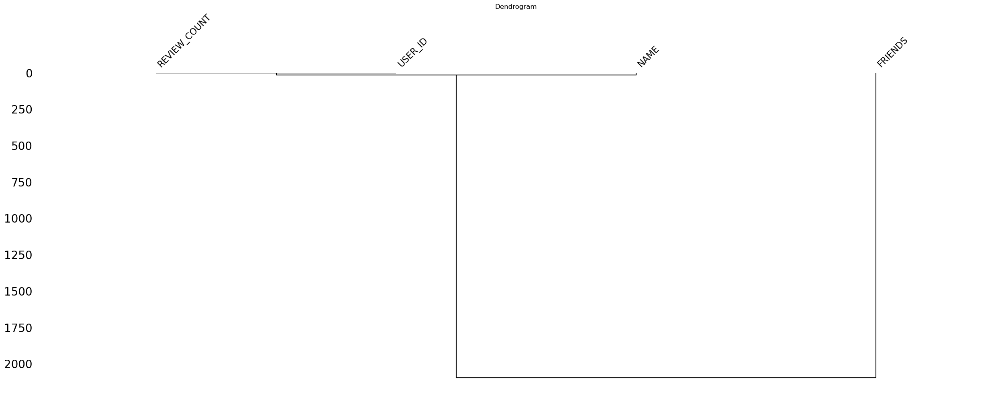

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

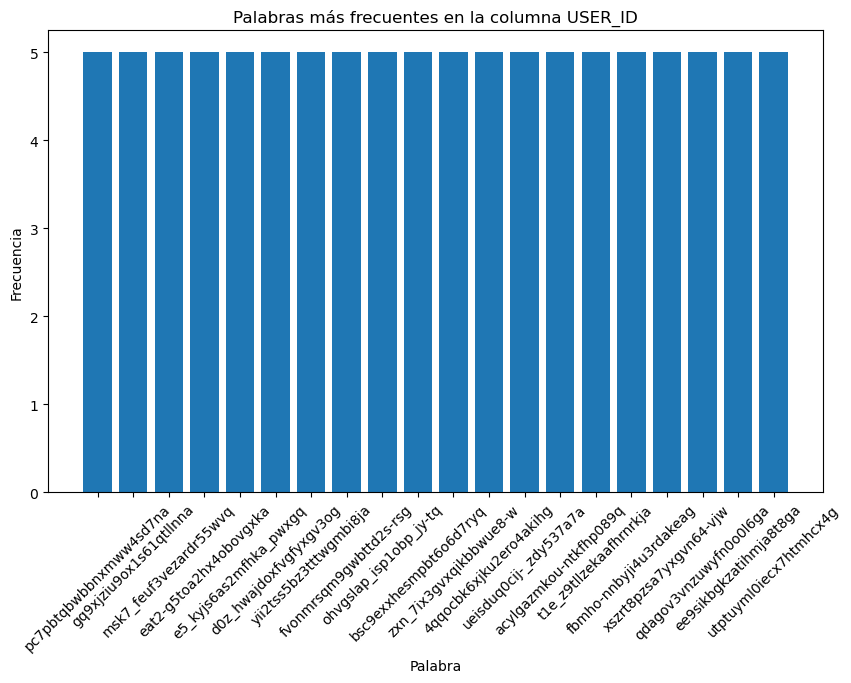

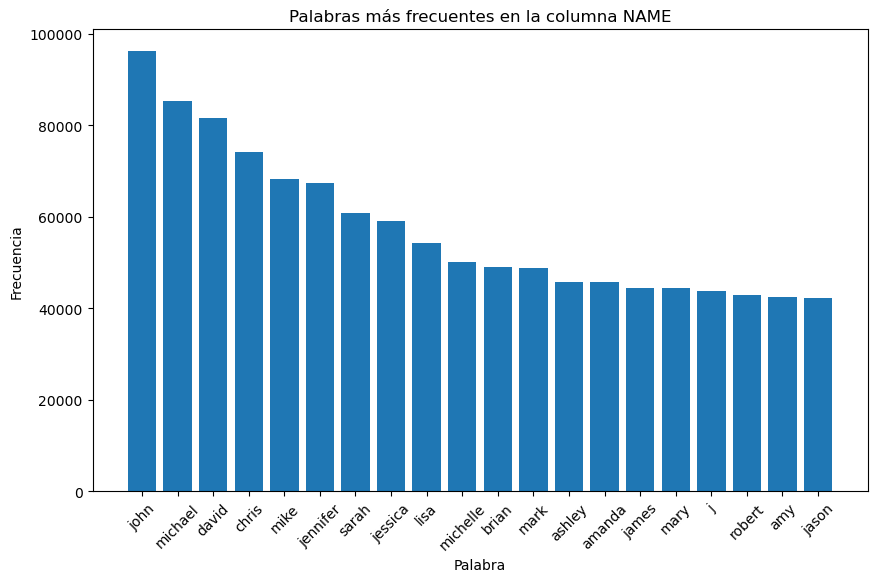

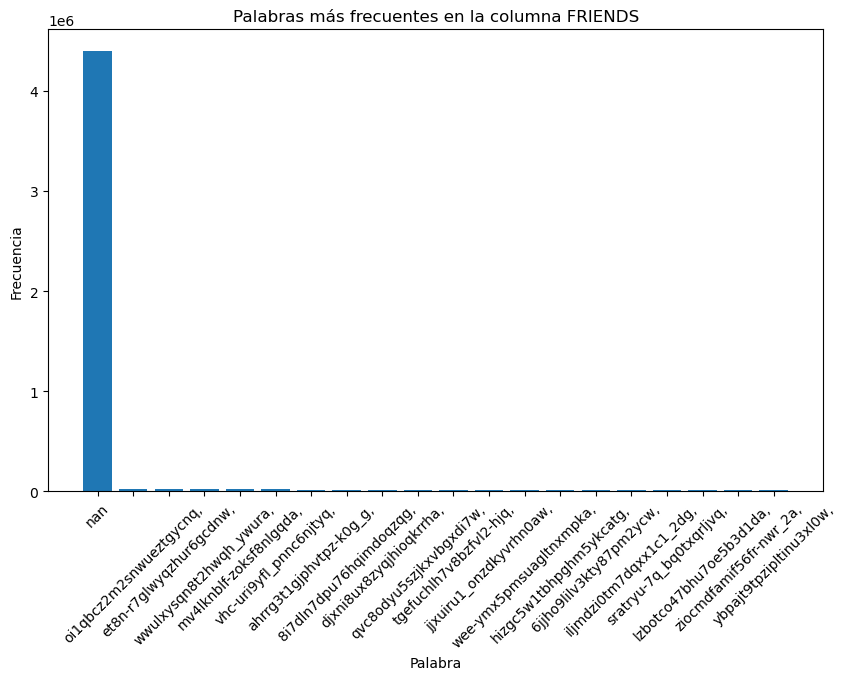

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

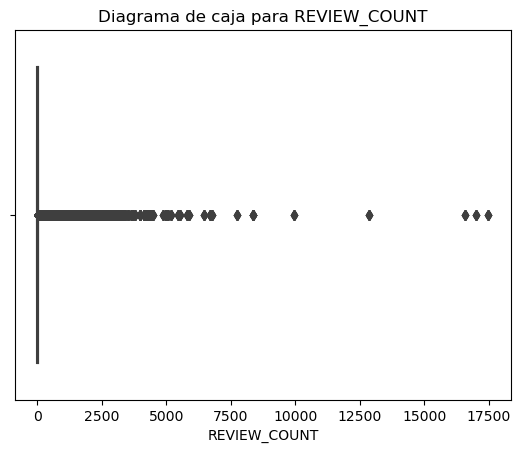

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

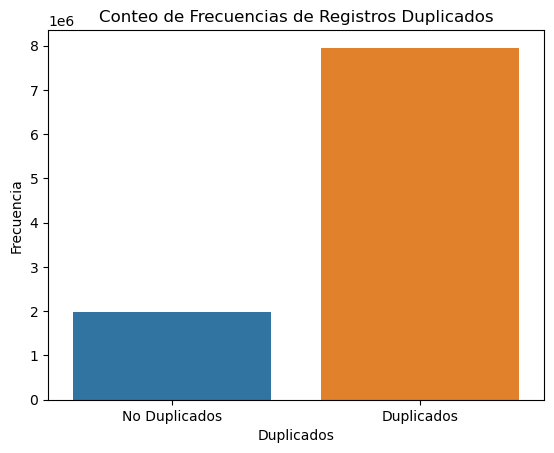

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

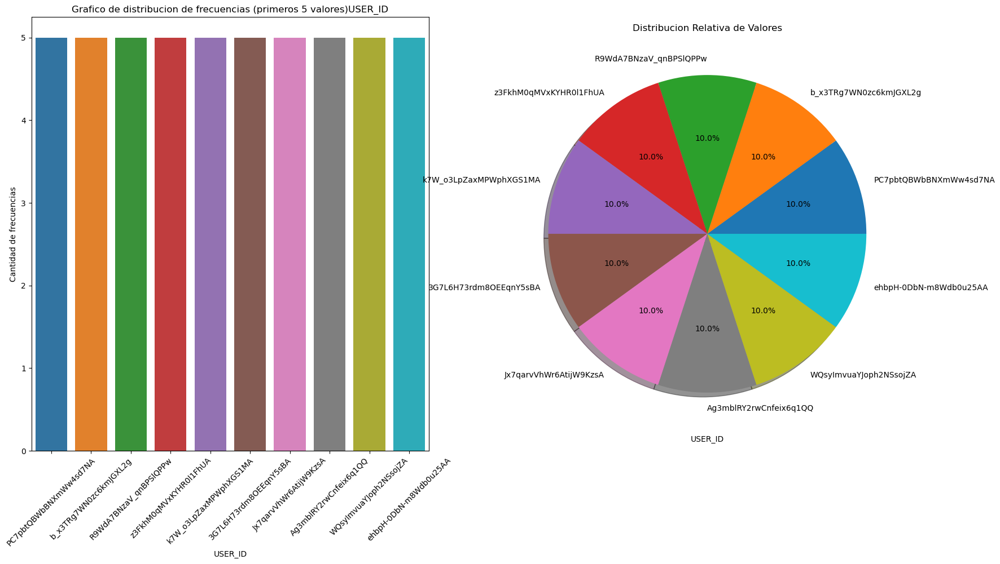



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




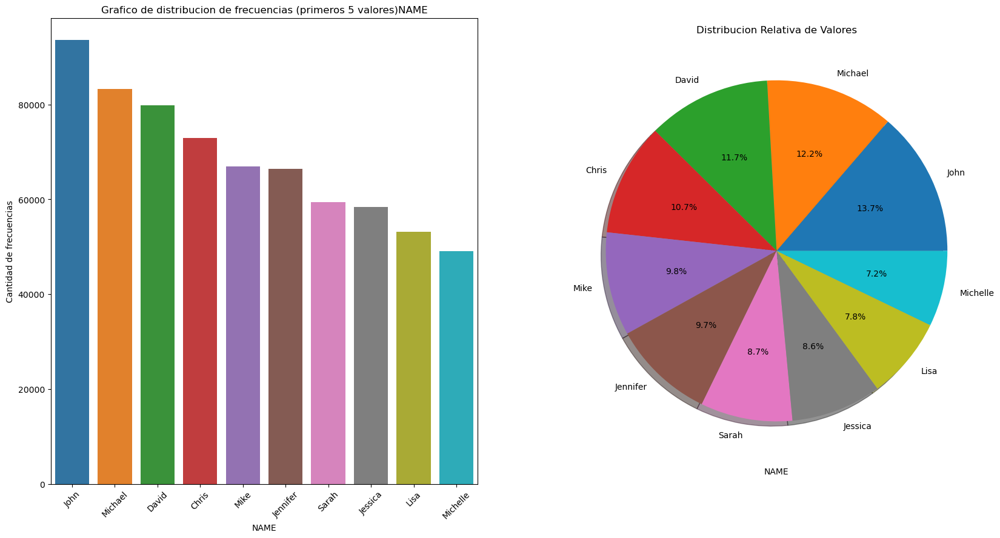



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




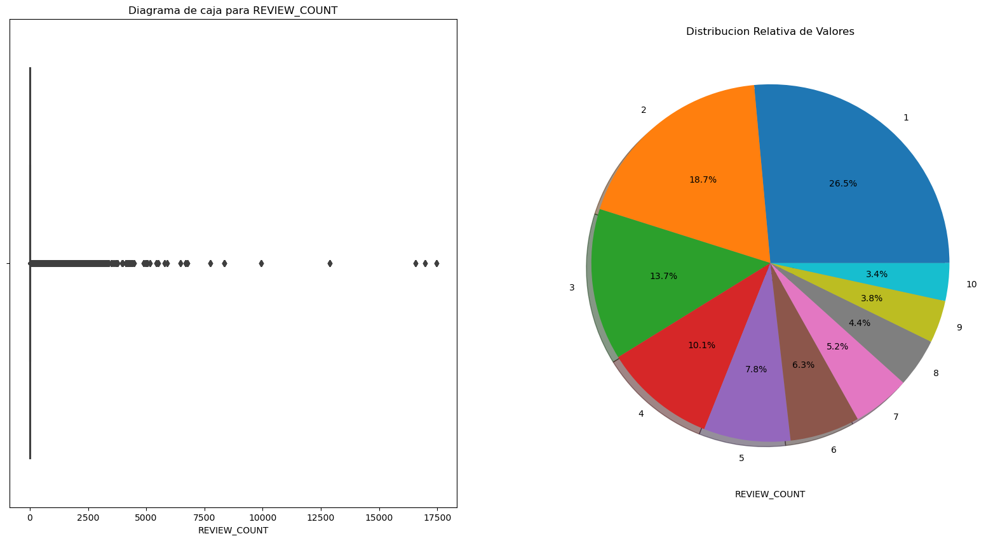



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




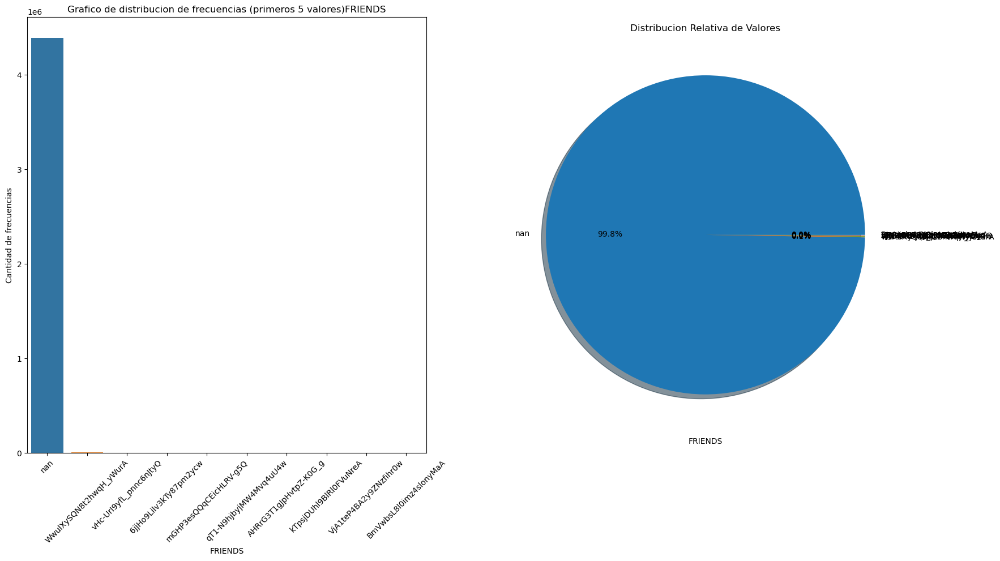



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

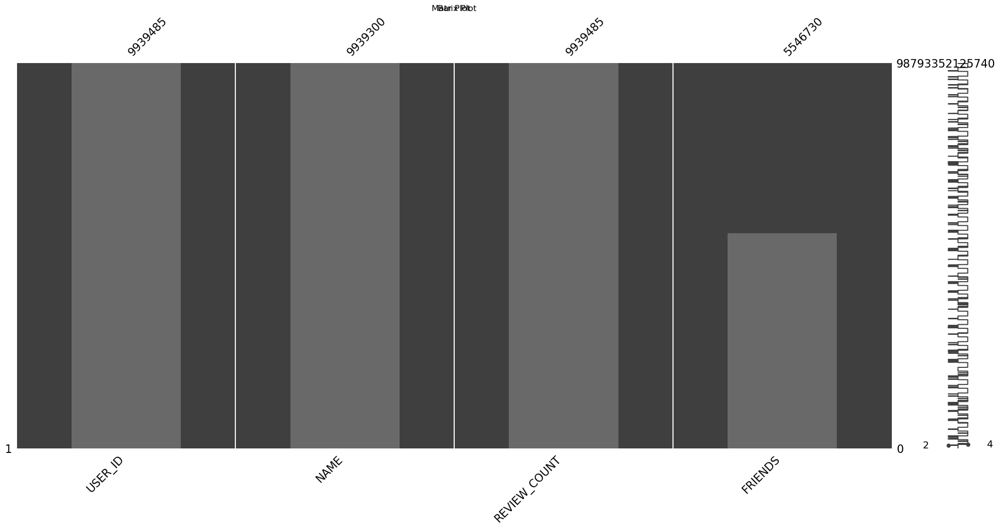

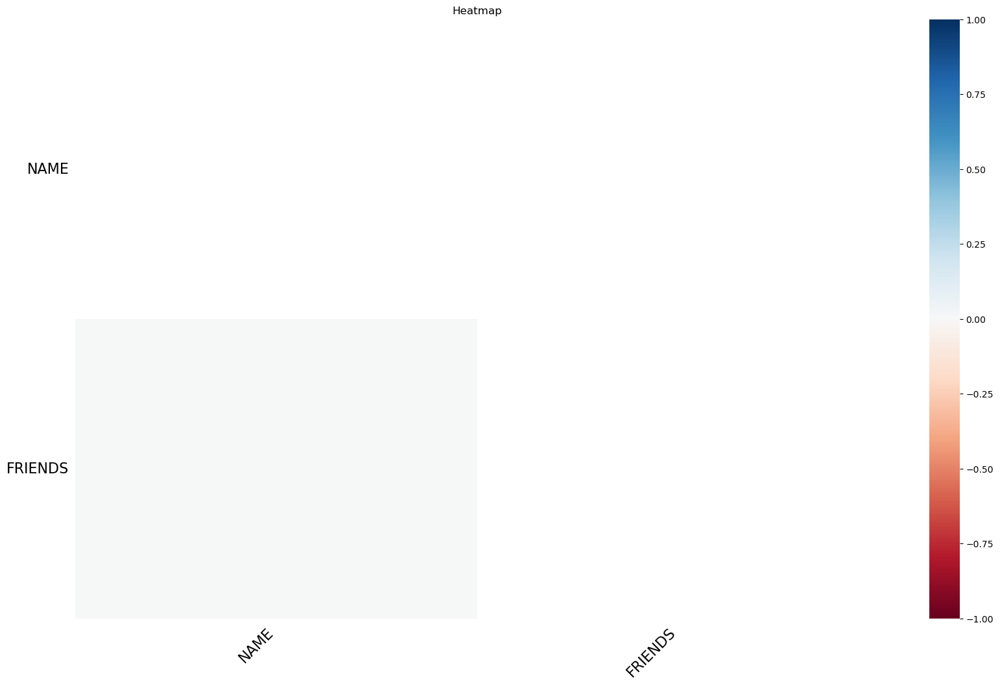

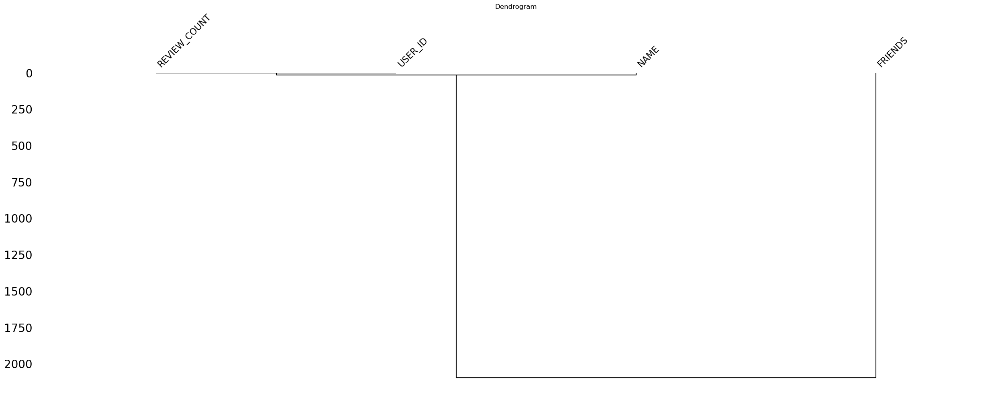

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

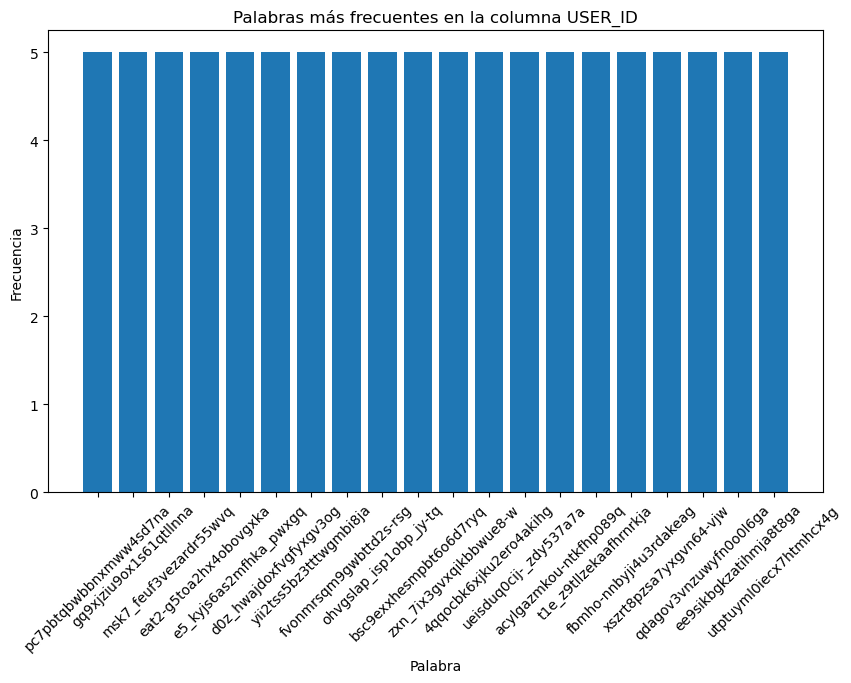

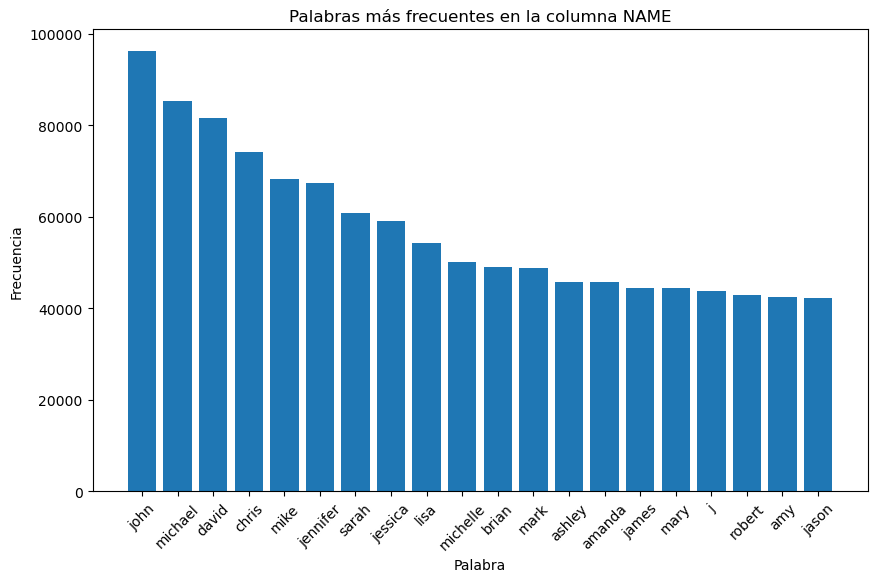

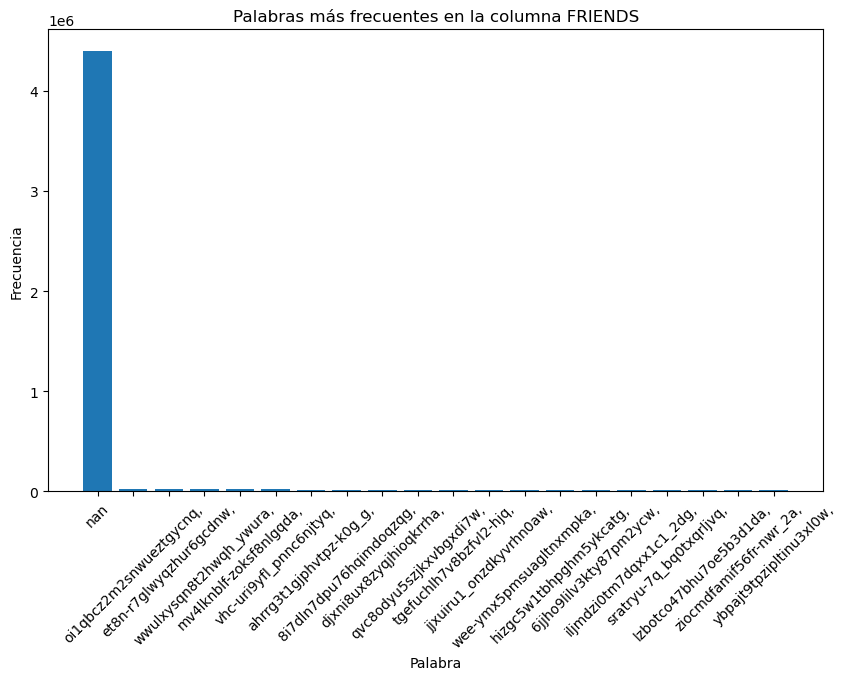

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

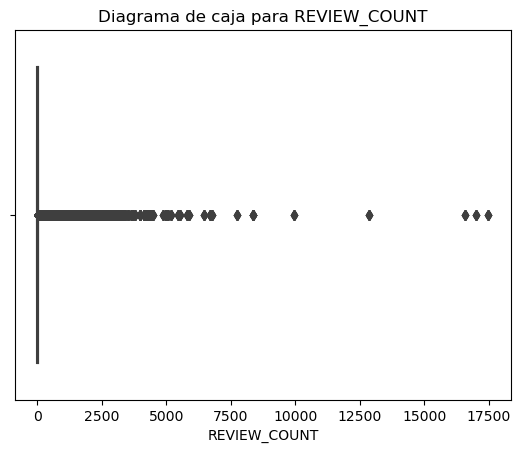

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

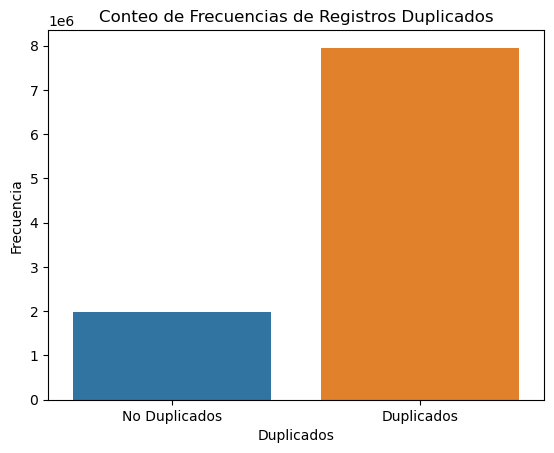

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

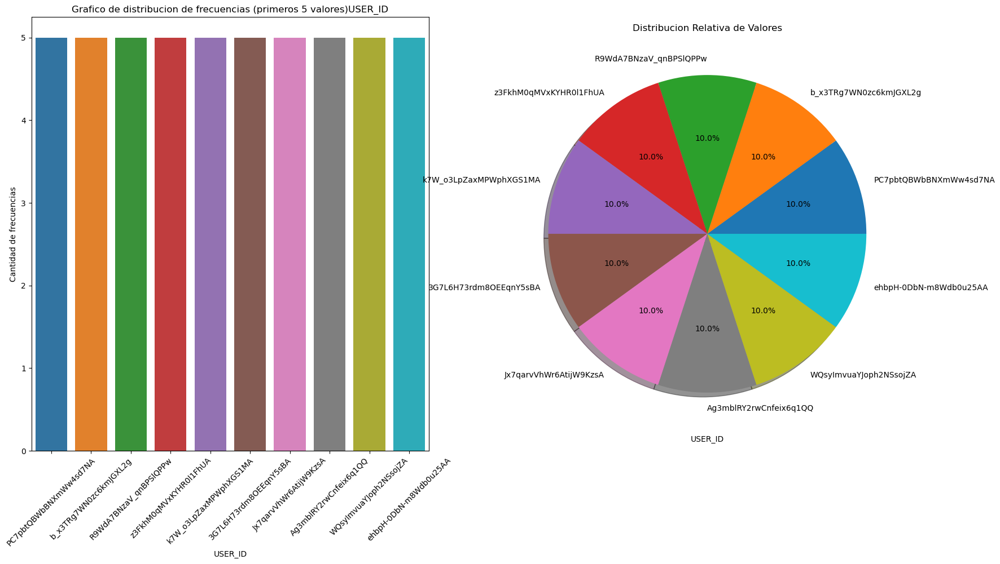



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




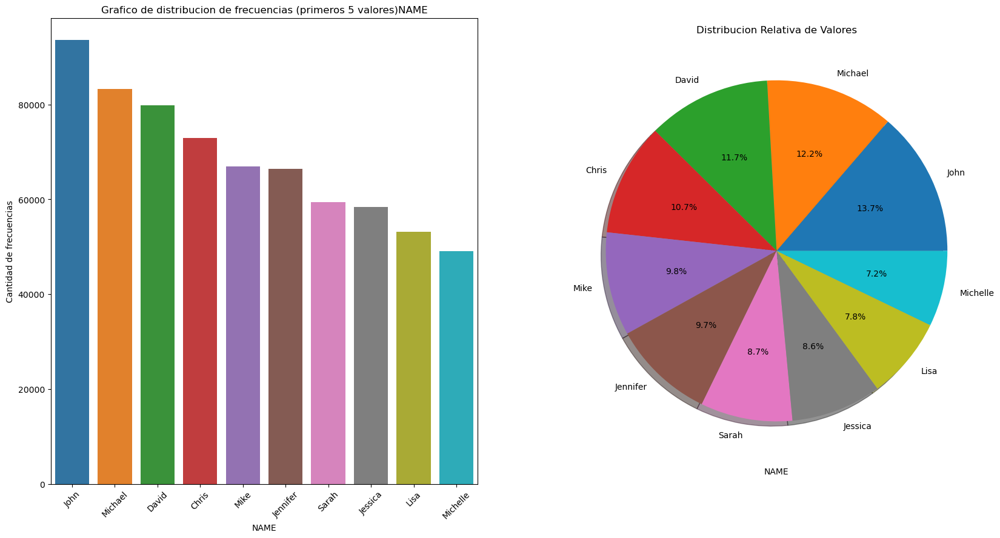



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




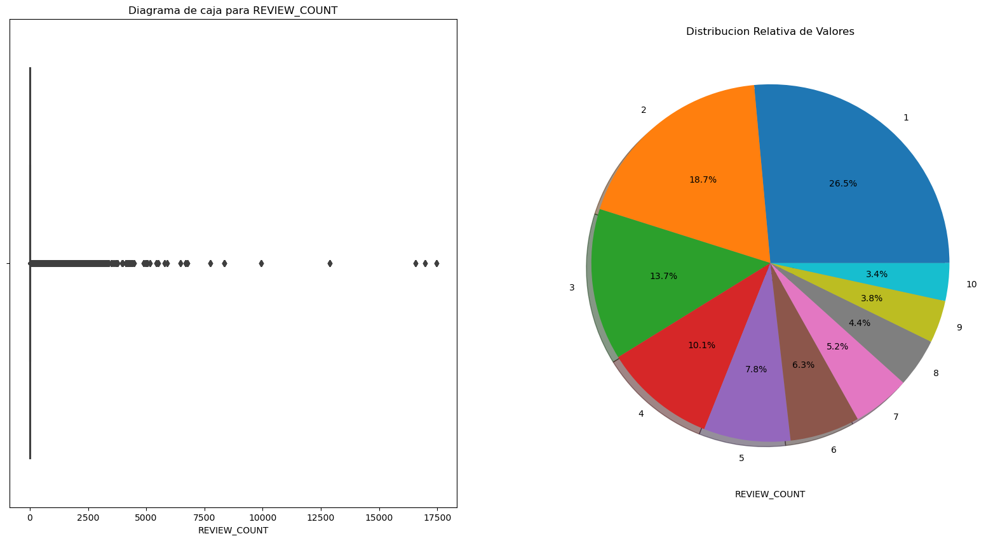



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




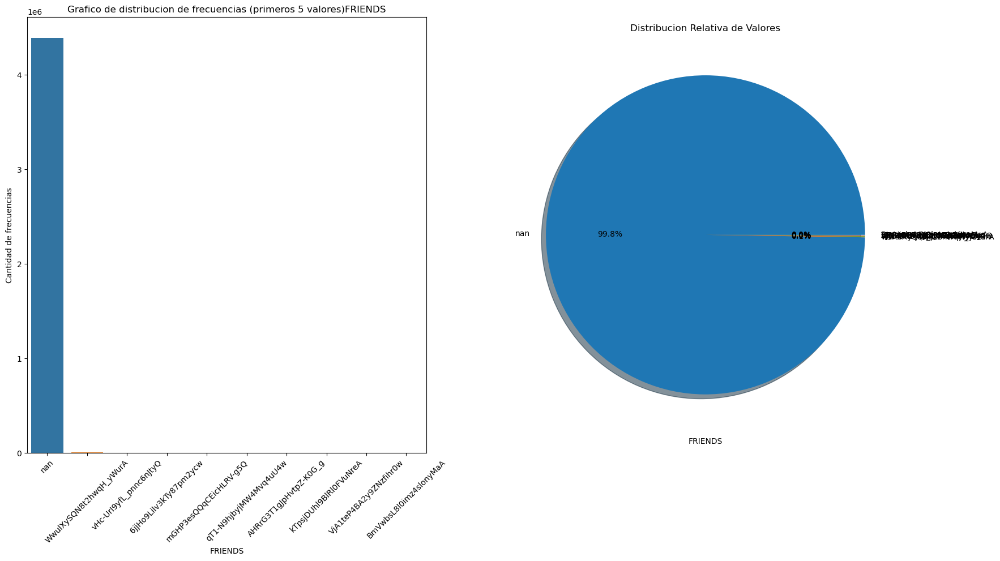



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

## <h2>USER</h2>

### <h3 align= 'center'><u>General</u></h3>

In [30]:
informe_dataframe(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 32, Finished, Available)

INFORME PRELIMINAR SOBRE CARACTERISTICAS DEL DATASET:

--Dimensiones del DataFrame--
Filas: 9939485
Columnas: 4

--Numero de datos--
35365000

--Filas y Columnas--
Filas: muestra de indices-------> [0, 1, 2, 3, 4]  -----> Desde 0  Hasta 9939484
Columnas: ['USER_ID', 'NAME', 'REVIEW_COUNT', 'FRIENDS']

--Tipo de columnas--
USER_ID         object
NAME            object
REVIEW_COUNT     int64
FRIENDS         object
dtype: object

--Cantidad de registros duplicados--
7951588



'~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~oo~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~'

In [31]:
verificar_tipo_datos(df_USER)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 33, Finished, Available)

,nombre_campo,tipo_datos,no_nulos_%,nulos_%,nulos
0,USER_ID,[<class 'str'>],100.00,0.00,0
1,NAME,"[<class 'str'>, <class 'float'>]",100.00,0.00,185
2,REVIEW_COUNT,[<class 'int'>],100.00,0.00,0
3,FRIENDS,"[<class 'str'>, <class 'float'>]",55.81,44.19,4392755


### <h3 align= 'center'><u>Particular</u></h3>

In [32]:
for columna in df_USER.columns:
    informe_columna(df_USER, columna)

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 34, Finished, Available)

INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE USER_ID:

--Numero de datos nulos--
0

--Cantidad de valores unicos en la columna--
1987897

--Valores unicos en la columna (Primeros 5 valores)--
['PC7pbtQBWbBNXmWw4sd7NA' 'GQ9XJzIU9oX1S61qTLLNnA'
 'msk7_Feuf3veZARDr55wVQ' 'EAT2-g5tOA2Hx4oBOvgXKA'
 'E5_KyjS6As2mfhkA_pwXgQ']

--Moda de la columna especificada--
Valor modal -----> PC7pbtQBWbBNXmWw4sd7NA
Frecuencia acumulada ------> 5

--Distribucion de frecuencias (primeros valores con mayor cantidad de frecuencias)--
 USER_ID
PC7pbtQBWbBNXmWw4sd7NA    5
b_x3TRg7WN0zc6kmJGXL2g    5
R9WdA7BNzaV_qnBPSlQPPw    5
Name: count, dtype: int64

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
INFORME PRELIMINAR SOBRE LA COLUMNA/FEATURE NAME:

--Numero de datos nulos--
185

--Cantidad de valores unicos en la colum

### <h3 size= 22 align= 'center'><u>Gráficos</u></h3>

StatementMeta(, 2f9a623d-1b84-4f62-bc0a-0df63ede293f, 35, Finished, Available)

<Figure size 3000x3000 with 0 Axes>

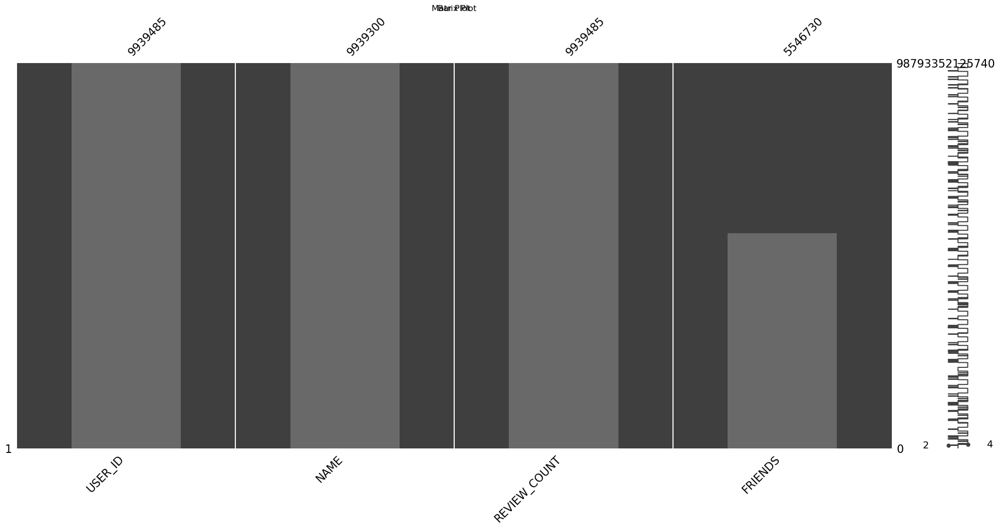

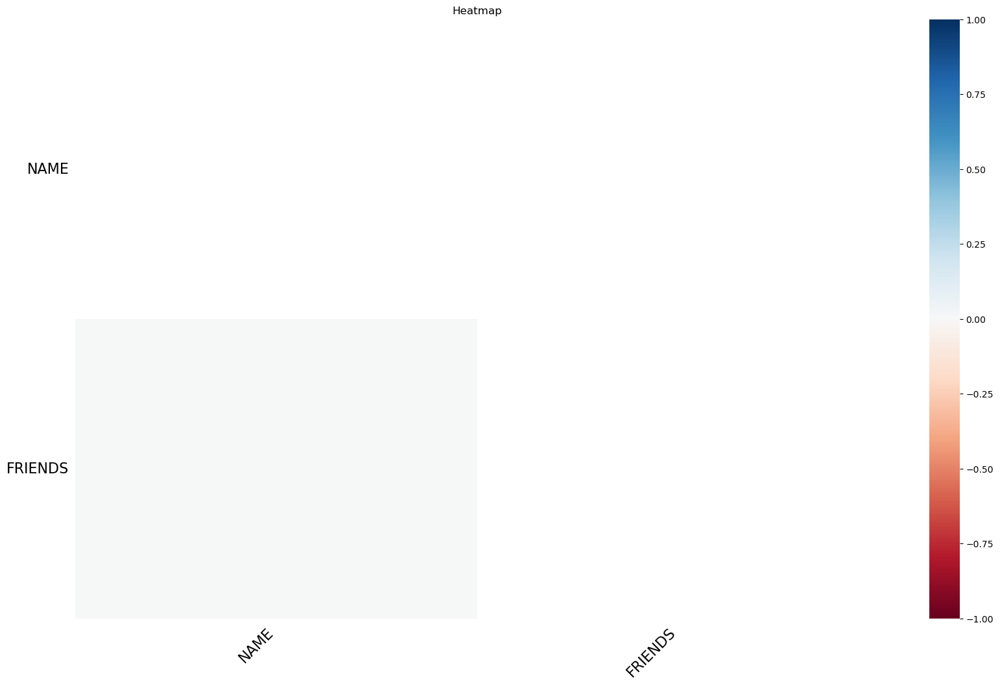

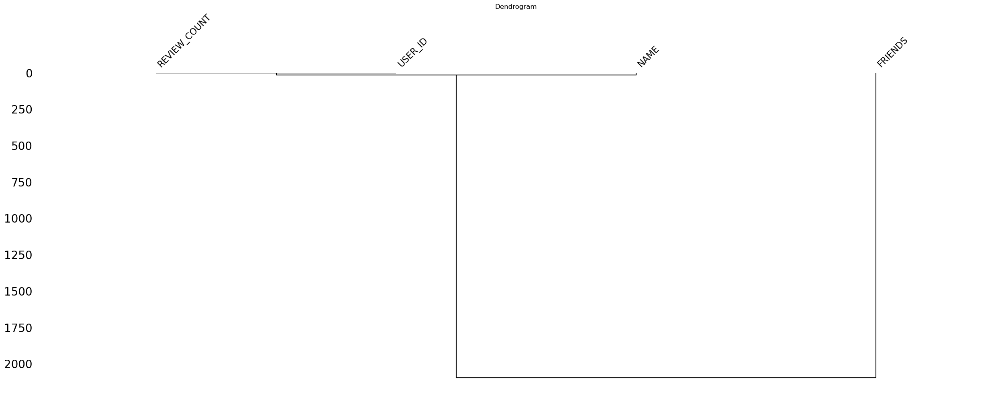

In [33]:
visualizar_nulos(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 18, Finished, Available)

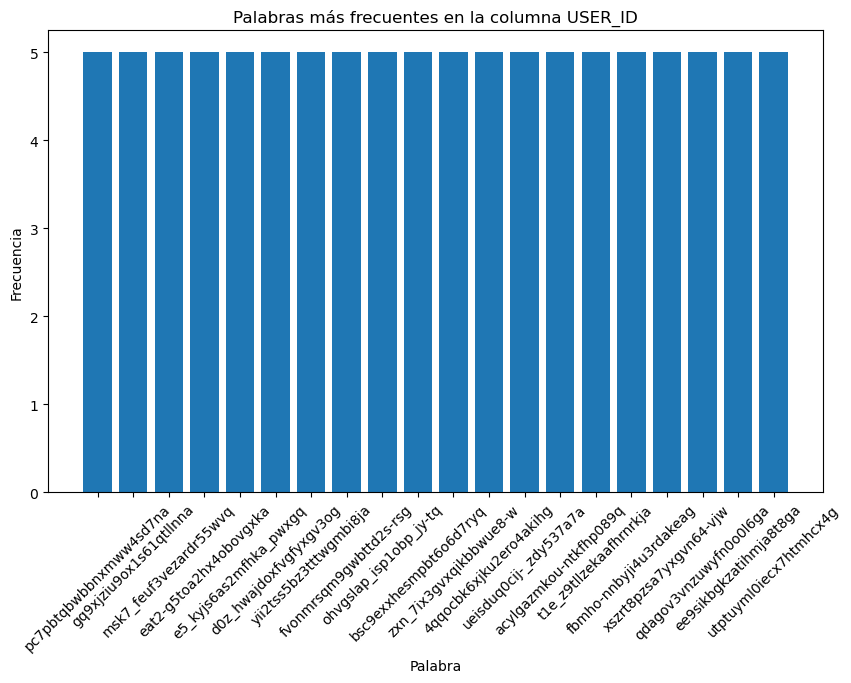

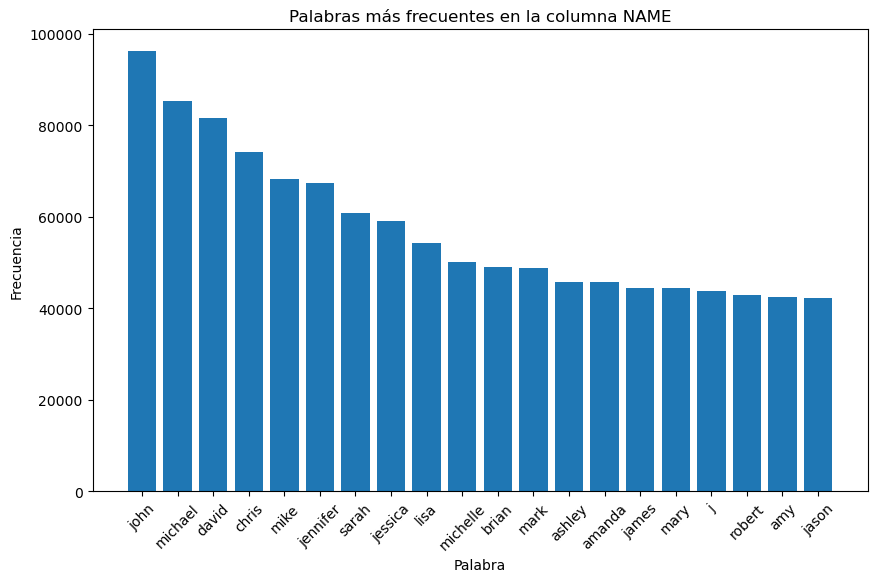

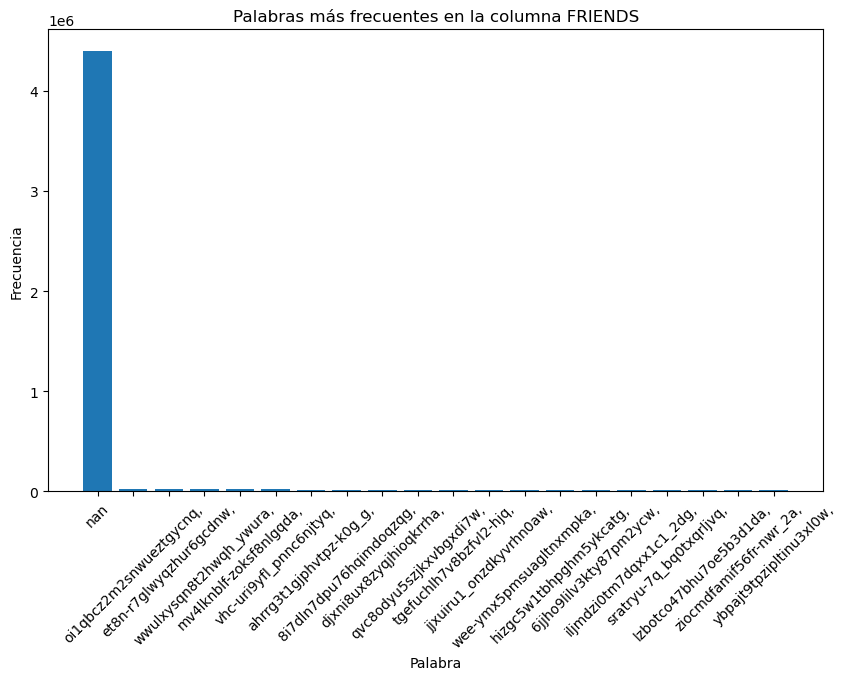

In [16]:
analisis_frecuencia_palabras(df_USER)


StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 19, Finished, Available)

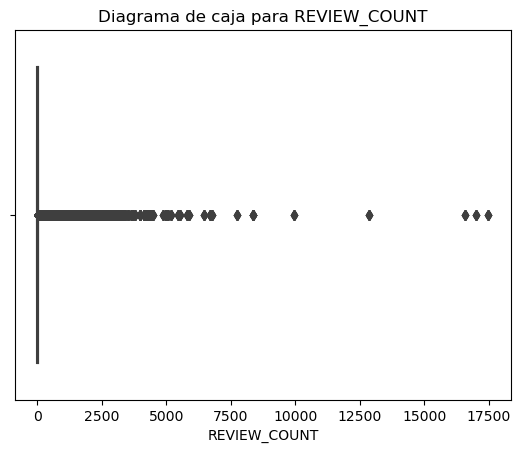

In [17]:
boxplots_numericas(df_USER)

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 21, Finished, Available)

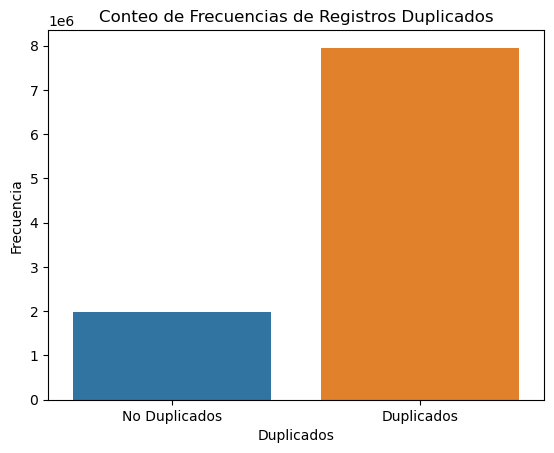

In [19]:
hist_duplicados(df_USER)

### <h2 align= 'center'><u>Análisis Descriptivo</u></h2>

StatementMeta(, a444fbd4-627b-4f74-ac22-b29936391391, 25, Finished, Available)

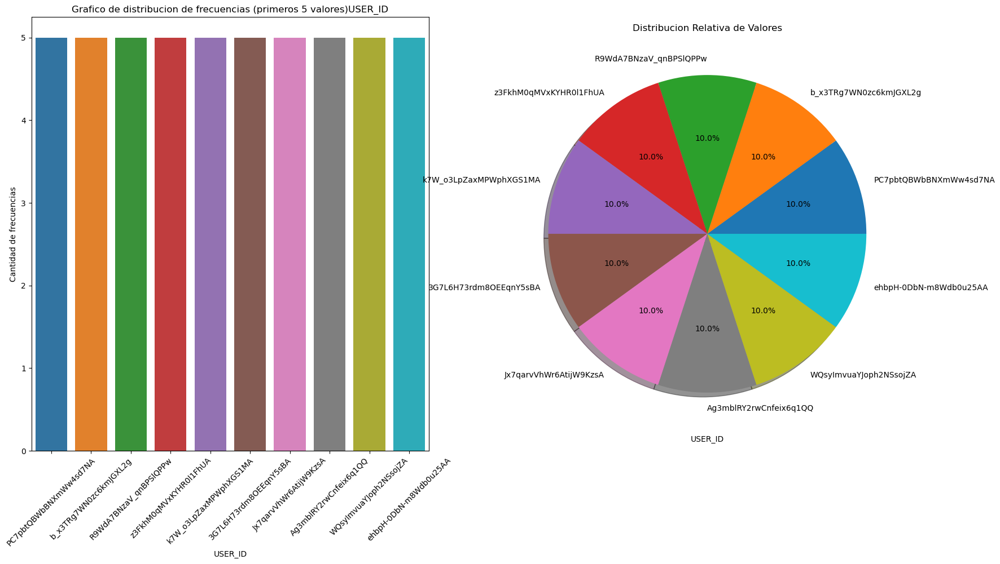



Estadisticas Basicas


count                    9939485
unique                   1987897
top       PC7pbtQBWbBNXmWw4sd7NA
freq                           5
Name: USER_ID, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




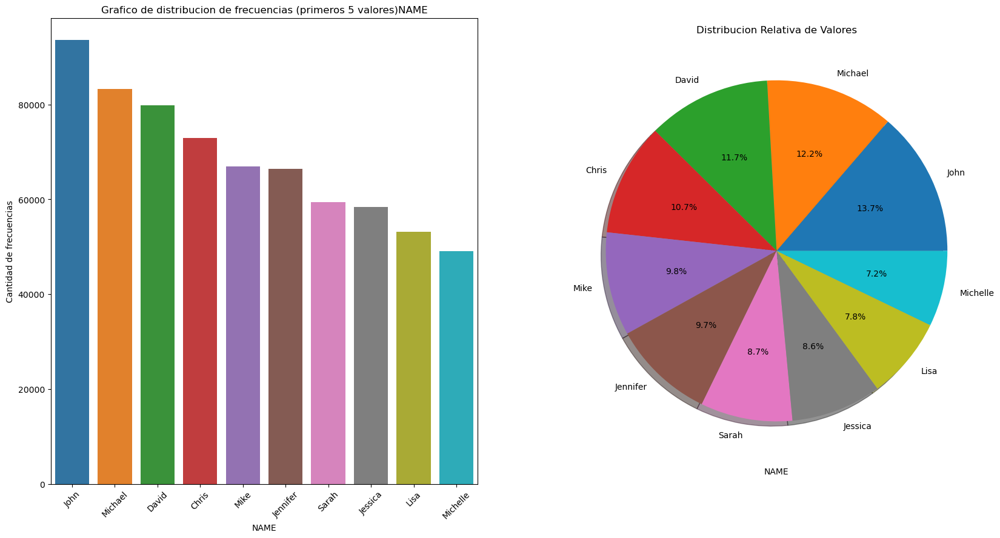



Estadisticas Basicas


count     9939485
unique     132359
top          John
freq        93595
Name: NAME, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




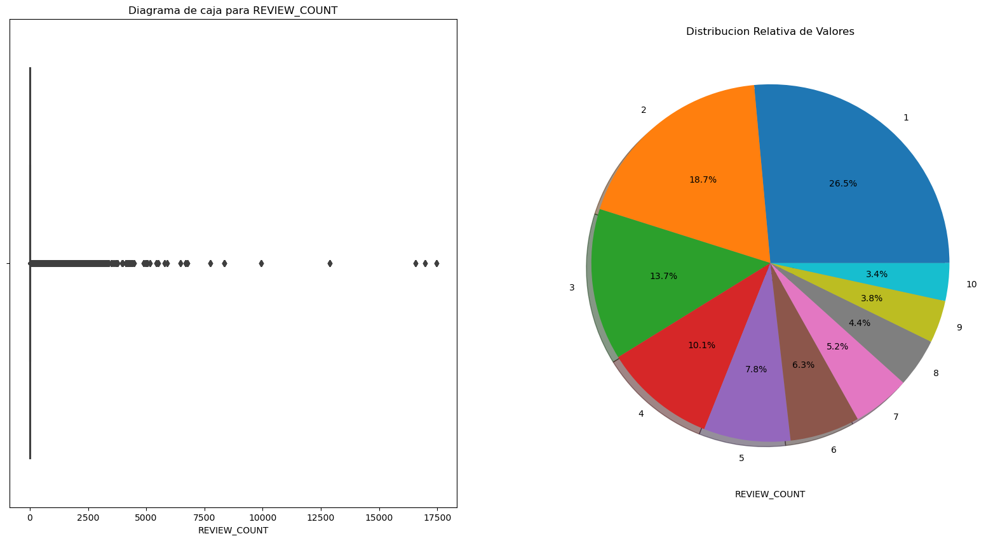



Estadisticas Basicas


count    9.939485e+06
mean     2.339441e+01
std      8.256698e+01
min      0.000000e+00
25%      2.000000e+00
50%      5.000000e+00
75%      1.700000e+01
max      1.747300e+04
Name: REVIEW_COUNT, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




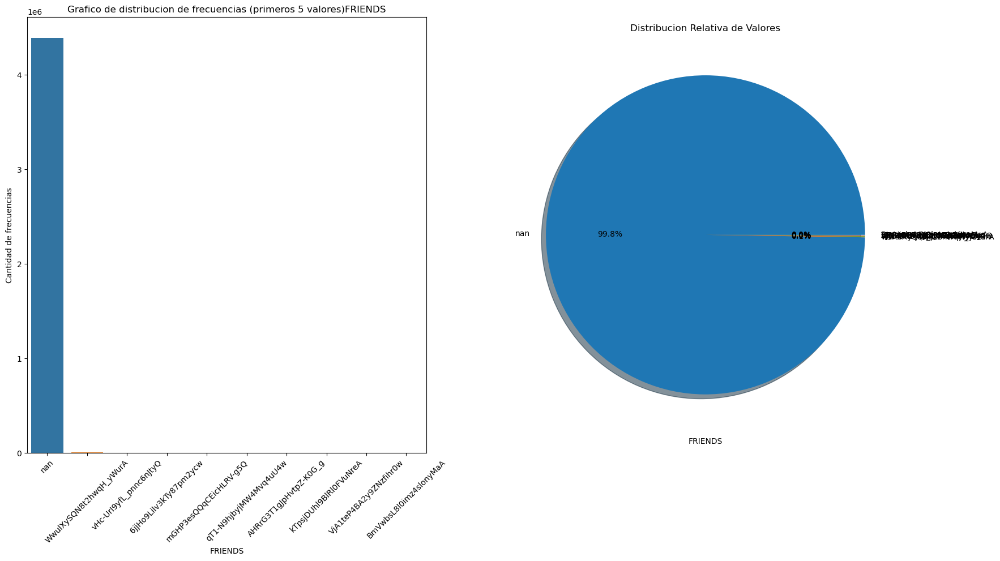



Estadisticas Basicas


count     9939485
unique    1091999
top           nan
freq      4392755
Name: FRIENDS, dtype: object
----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------




In [23]:
descripcion_distribucion(df_USER)

# <h1 align= 'center'><u>**Análisis General**</u></h>

# <h1 align= 'center'><u>**Conclusiones**</u></h1>

# Diccionario de Datos